In [1]:
import bottleneck as bn
import matplotlib
import matplotlib.dates as mdates
import matplotlib.patheffects
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
import scienceplots
import scipy
import scipy.signal
import scipy.special
import scipy.stats
import sklearn.decomposition

from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from obspy import UTCDateTime
from obspy.clients.fdsn import Client

plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])
# plt.rcParams['mathtext.fontset'] = 'dejavuserif'

title_font = {'fontsize': 16, 'weight': 'bold', 'style': 'italic'}

read_path = 'Data/'
save_path = 'Figure/'

%matplotlib ipympl

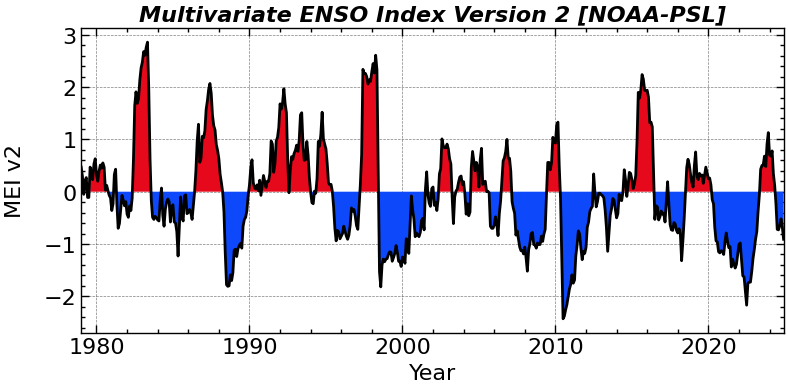

In [3]:
meiv2_df = pd.read_csv('meiv2.data',
                       header=None,
                       skiprows=1,
                       sep='\s+',
                       on_bad_lines='skip')
meiv2_values = np.array(meiv2_df.iloc[:46, 1:]).flatten().astype(float)
meiv2_years = np.array(
    meiv2_df.iloc[0, 0]).astype(float) + np.arange(meiv2_values.size) / 12.0

plt.close()
plt.figure(figsize=(8, 4), tight_layout=True)
ax1 = plt.subplot(1, 1, 1)

ax1.fill_between(meiv2_years,
                 0 * meiv2_values,
                 meiv2_values,
                 where=meiv2_values <= 0)
ax1.fill_between(meiv2_years,
                 0 * meiv2_values,
                 meiv2_values,
                 where=meiv2_values > 0)

ax1.plot(meiv2_years, meiv2_values, 'k-', alpha=1.0)

ax1.autoscale(axis='x', tight=True)
ax1.set_xlabel('Year')
ax1.set_ylabel('MEI v2')
ax1.set_title('Multivariate ENSO Index Version 2 [NOAA-PSL]', **title_font)
ax1.yaxis.set_label_coords(-0.08, 0.5)

plt.savefig(save_path + 'figure_meiv2' + '.png', bbox_inches='tight', dpi=300)

plt.show()

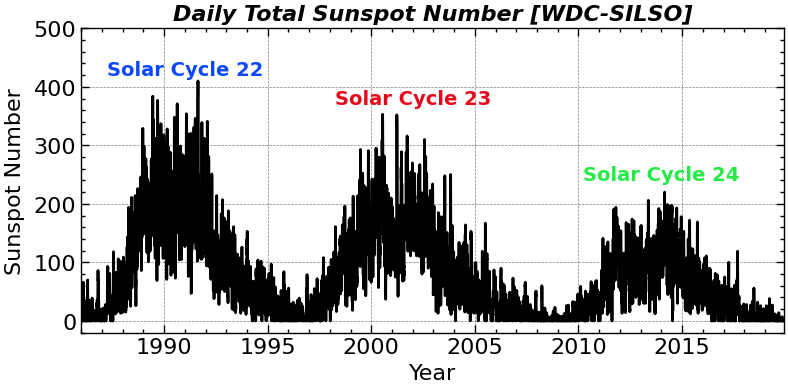

In [4]:
sn_df = pd.read_csv('SN_d_tot_V2.0.txt',
                    header=None,
                    sep='\s+',
                    on_bad_lines='skip')
sn_years = np.array(sn_df.iloc[:, 3]).astype(float)
sn_sn = np.array(sn_df.iloc[:, 4]).astype(float)

plt.close()
plt.figure(figsize=(8, 4), tight_layout=True)
ax1 = plt.subplot(1, 1, 1)

ax1.plot(sn_years, sn_sn, 'k-', alpha=1.0)

ax1.autoscale(axis='x', tight=True)
ax1.set_xlim(1986, 2019.9)
ax1.set_ylim(-20, 500)
ax1.set_xlabel('Year')
ax1.set_ylabel('Sunspot Number')
ax1.set_title('Daily Total Sunspot Number [WDC-SILSO]', **title_font)

ax1.text(1991,
         430,
         'Solar Cycle 22',
         fontsize=14,
         color='C0',
         ha='center',
         va='center',
         weight='bold')
ax1.text(2002,
         380,
         'Solar Cycle 23',
         fontsize=14,
         color='C1',
         ha='center',
         va='center',
         weight='bold')
ax1.text(2014,
         250,
         'Solar Cycle 24',
         fontsize=14,
         color='C2',
         ha='center',
         va='center',
         weight='bold')
ax1.yaxis.set_label_coords(-0.08, 0.5)

plt.savefig(save_path + 'figure_sunspot' + '.png', bbox_inches='tight', dpi=300)

plt.show()

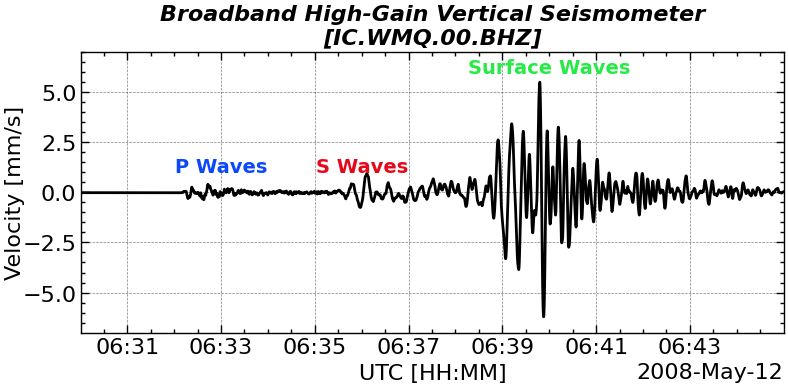

In [14]:
from obspy import UTCDateTime
from obspy.clients.fdsn import Client

# 连接IRIS服务
client = Client("IRIS")

starttime = UTCDateTime("2008-05-12T06:30:01")
endtime = UTCDateTime("2008-05-12T06:45:00")
# 下载波形数据（垂向BHZ）
st = client.get_waveforms(
    network="IC", station="WMQ", location="00", channel="BHZ",
    starttime=starttime,
    endtime=endtime
)


# 下载台站元数据（响应信息）
inv = client.get_stations(
    network="IC", station="WMQ", level="response",
    starttime=starttime,
    endtime=endtime
)
st.remove_response(inventory=inv, output="VEL")  


%matplotlib ipympl
plt.close()
plt.cla()
plt.clf()
plt.figure(figsize=(8, 4), tight_layout=True)
ax1 = plt.subplot(1, 1, 1)
dt = 1 / st.traces[0].stats.sampling_rate
t = np.datetime64(starttime) + (np.arange(0, len(st[0].data)).astype(float) * dt * 1e3).astype('timedelta64[ms]')
ax1.plot(t, st[0].data * 1e3, 'k-')
ax1.set_ylim(-6.99, 7)
ax1.set_xlabel('UTC [HH:MM]')
ax1.set_ylabel('Velocity [mm/s]')
ax1.set_title('Broadband High-Gain Vertical Seismometer\n' + f"[{st[0].id}]", **title_font)
ax1.autoscale(axis = 'x', tight = True)
ax1.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
ax1.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax1.xaxis.get_major_locator()))
ax1.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax1.text(np.datetime64('2008-05-12T06:33:00'), 1.3, 'P Waves', fontsize=14, color='C0', ha='center', va='center', weight = 'bold')
ax1.text(np.datetime64('2008-05-12T06:36:00'), 1.3, 'S Waves', fontsize=14, color='C1', ha='center', va='center', weight = 'bold')
ax1.text(np.datetime64('2008-05-12T06:40:00'), 6.2, 'Surface Waves', fontsize=14, color='C2', ha='center', va='center', weight = 'bold')
ax1.yaxis.set_label_coords(-0.08, 0.5)

plt.savefig(save_path + 'figure_seismic_waves' + '.png',bbox_inches='tight',dpi=300)
plt.show()

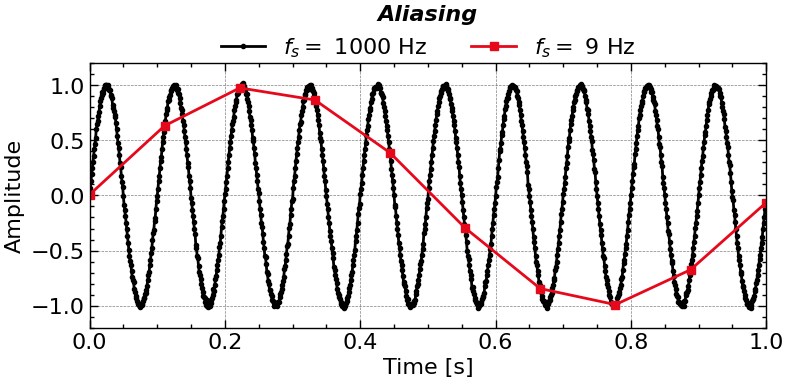

In [110]:
plt.close()
plt.figure(figsize=(8, 4), tight_layout=True)
ax1 = plt.subplot(1, 1, 1)


omega0 = 2 * np.pi * 10.0
N = 1000
N_DOWNSAMPLE = 111
t = np.linspace(0, 1, N, endpoint=False)
dt = t[1] - t[0]
fs = 1 / dt
x = np.sin(omega0 * t) + np.random.randn(t.size) * 0.01
# ax1.plot(time, signal, 'k-', label = 'Signal')
ax1.plot(t, x, 'ko-', label=r'$\mathit{f_s}=$' + ' %d Hz' % fs)
ax1.plot(t[::N_DOWNSAMPLE], x[::N_DOWNSAMPLE], 'C1s-', label='$f_s=$ %d Hz' % (fs / N_DOWNSAMPLE), markersize=6, fillstyle = 'full')

# plt.title('Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

ax1.set_xlim(0, 1)
ax1.set_ylim(-1.2, 1.2)

ax1.legend(loc='upper center', frameon=False, ncol = 3, bbox_to_anchor=(0.5, 1.18))
ax1.set_title('Aliasing', y = 1.13, **title_font)
plt.tight_layout()

plt.savefig(save_path + 'figure_aliasing' + '.png',bbox_inches='tight',dpi=300)

plt.show()

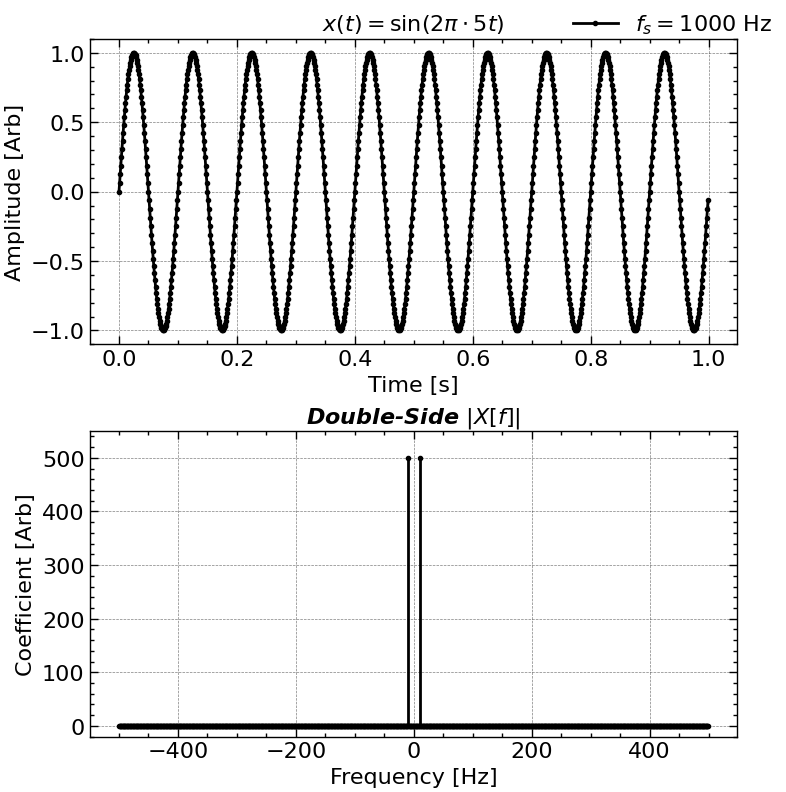

In [111]:
%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8), tight_layout=True)

ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

omega0 = 2 * np.pi * 10.0

N = 1000
t = np.linspace(0, 1, N, endpoint=False)
dt = t[1] - t[0]
fs = 1 / dt  # Sampling frequency

x = np.sin(omega0 * t)

ax1.plot(t, x, 'ko-', label = '$\mathit{f_s}=$%d Hz' % fs)

# coefs = np.fft.rfft(x)
# freq = np.fft.rfftfreq(len(t), t[1] - t[0])

# ax2.stem(freq, np.abs(coefs), linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')

coefs = np.fft.fft(x)
freq = np.fft.fftfreq(len(t), t[1] - t[0])

ax2.stem(freq, np.abs(coefs), linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')


ax1.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5 t)$')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')

ax2.set_title(r'Double-Side $|X[f]|$', **title_font)
ax2.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Coefficient [Arb]')

ax2.set_ylim(-20, 550)


ax1.legend(frameon = False, bbox_to_anchor = (0.9, 1.15), loc = 'upper center')

plt.tight_layout()

plt.savefig(save_path + 'figure_dft_double_side' + '.png',bbox_inches='tight',dpi=300)

plt.show()

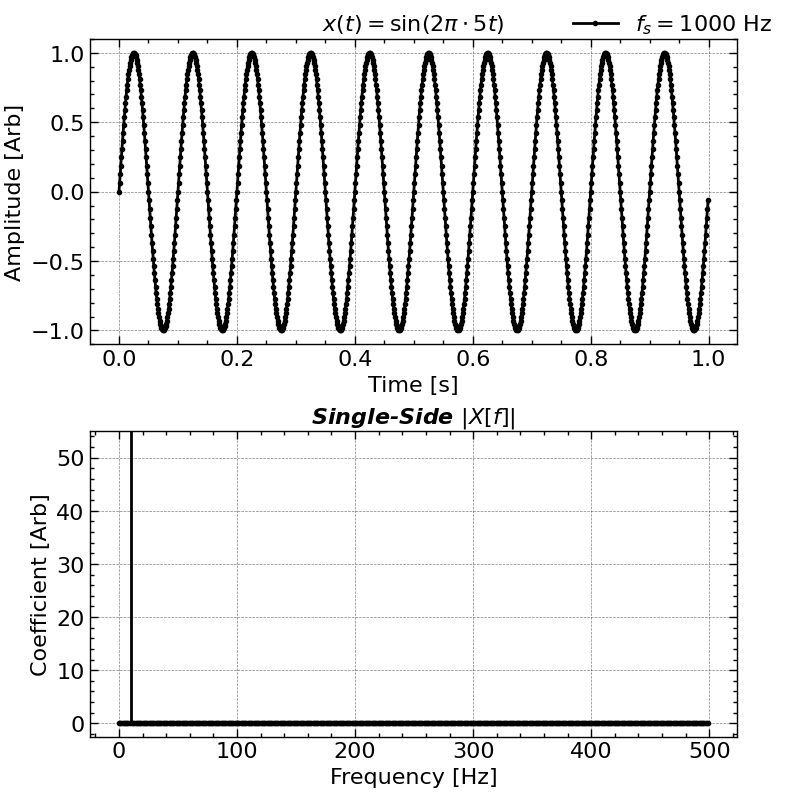

In [89]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8), tight_layout=True)

ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

omega0 = 2 * np.pi * 10.0
# omega1 = 2 * np.pi * 12.0

N = 1000
t = np.linspace(0, 1, N, endpoint=False)
dt = t[1] - t[0]
fs = 1 / dt  # Sampling frequency
# x = np.sin(omega0 * time) + np.sin(omega1 * time)
x = np.sin(omega0 * t)

ax1.plot(t, x, 'ko-', label = '$\mathit{f_s}=$%d Hz' % fs)

coefs = np.fft.fft(x)
freq = np.fft.fftfreq(len(t), dt)

pos_mask = freq >= 0
freq = freq[pos_mask]

ax2.stem(freq, np.abs(coefs)[pos_mask], linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')

N_PADDING = 20

time = np.linspace(0, 1 + N_PADDING / 200, 200 + N_PADDING, endpoint=False)
x = np.sin(omega0 * time)
x *= np.hanning(np.size(x)) * np.sqrt(8 / 3)
x[-(N_PADDING + 1):] *= 0

# ax1.plot(time, x, 'r.-', label = 'Windowed [Hanning]', alpha = 0.5)

coefs = np.fft.fft(x, n = len(time))
freq = np.fft.fftfreq(len(time), time[1] - time[0])

pos_mask = freq >= 0
freq = freq[pos_mask]

# ax2.stem(freq, np.abs(coefs)[pos_mask], linefmt = 'r', markerfmt = 'r.', basefmt = 'r-')

for N_PADDING in range(1, 100, 2):
    coefs = np.fft.fft(x, n = len(time) + N_PADDING)
    freq = np.fft.fftfreq(len(time) + N_PADDING, time[1] - time[0])

    pos_mask = freq >= 0
    freq = freq[pos_mask]
    arg_max = np.argmax(np.abs(coefs)[pos_mask])
    # ax2.plot(freq[arg_max], np.abs(coefs)[pos_mask][arg_max], 'g.')

ax1.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5 t)$')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')

ax2.set_title(r'Single-Side $|X[f]|$', **title_font)
ax2.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Coefficient [Arb]')

# ax2.set_xlim(0, 20)
ax2.set_ylim(-2.5, 55)

ax1.legend(frameon = False, bbox_to_anchor = (0.9, 1.15), loc = 'upper center')

plt.tight_layout()

# plt.savefig(save_path + 'figure_dft' + '.png',bbox_inches='tight',dpi=300)

plt.show()

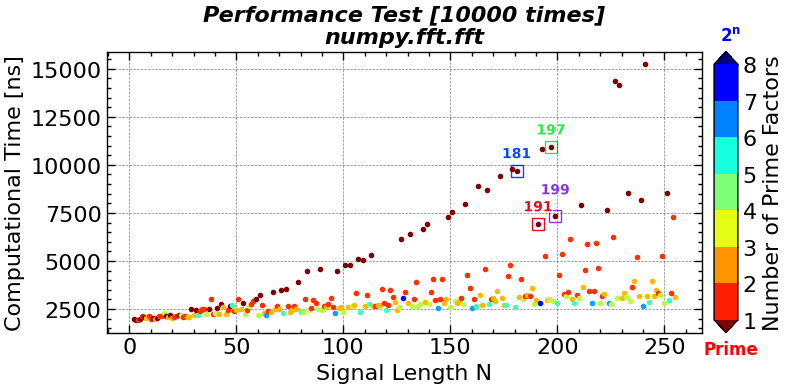

In [63]:
import time
import sympy

plt.close()

plt.figure(figsize=(8, 4), tight_layout=True)
ax1 = plt.subplot(1, 1, 1)

N_LENGTHS = np.arange(2, 256, 1)
TIME_PER_THOUSAND_RUNS_NUMPY = np.zeros(N_LENGTHS.size)
TIME_PER_THOUSAND_RUNS_SCIPY = np.zeros(N_LENGTHS.size)
N_REPEATS = 10000

for N_LENGTH in N_LENGTHS:
    x = np.random.randn(N_LENGTH)

    _start_time = time.perf_counter_ns()

    for _ in range(N_REPEATS):
        coefs = np.fft.rfft(x)

    _end_time = time.perf_counter_ns()

    TIME_PER_THOUSAND_RUNS_NUMPY[
        N_LENGTHS == N_LENGTH] = (_end_time - _start_time) / 1e9 / N_REPEATS

    # _start_time = time.perf_counter_ns()

    # for _ in range (N_REPEATS):
    #     coefs = scipy.fft.fft(signal, workers = -1)

    # _end_time = time.perf_counter_ns()

    # TIME_PER_THOUSAND_RUNS_SCIPY[N_LENGTHS == N_LENGTH] = (_end_time - _start_time) / 1e9 / N_REPEATS

for i in N_LENGTHS:
    n = N_LENGTHS[i - 2]
    n_prime_factor = sum(sympy.ntheory.factor_.factorint(n).values())

    sc1 = ax1.plot(n,
                   1e9 * TIME_PER_THOUSAND_RUNS_NUMPY[i - 2],
                   color=matplotlib.cm.jet_r(((n_prime_factor - 1) / 7)),
                   marker='o')

circled_numbers = [181, 191, 197, 199]
for idx, circled_number in enumerate(circled_numbers):
    n = circled_number
    n_prime_factor = sum(sympy.ntheory.factor_.factorint(n).values())
    ax1.plot(n,
             1e9 * TIME_PER_THOUSAND_RUNS_NUMPY[N_LENGTHS == n],
             's',
             color=f"C{idx}",
             fillstyle='none',
             markersize=8,
             label=f'Prime {n}',
             zorder=-1)
    ax1.text(n,
             1e9 * TIME_PER_THOUSAND_RUNS_NUMPY[N_LENGTHS == n] +
             (1000 if n == 199 else 500),
             f'{n}',
             color=f"C{idx}",
             ha='center',
             va='bottom',
             fontsize=10,
             weight='bold',
             path_effects=[
                 matplotlib.patheffects.withStroke(linewidth=2, foreground='w')
             ])

ax1.set_ylabel('Computational Time [ns]')
ax1.set_xlabel('Signal Length N')

ax1.set_title('Performance Test' + f" [{N_REPEATS} times]\n" + 'numpy.fft.fft', **title_font)
# ax2.set_title('scipy.fft.fft Performance\n' + f"Repeat {N_REPEATS} times")

# ax1.set_yscale('log')

cmap = matplotlib.cm.jet_r
bounds = [1, 2, 3, 4, 5, 6, 7, 8]
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N, extend='both')

ax2 = ax1.inset_axes([1.02, 0.00, 0.04, 1.0])
cbar = plt.gcf().colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap),
                          cax=ax2,
                          orientation='vertical',
                          label="Number of Prime Factors")

plt.text(0.7,
         -.08,
         'Prime',
         transform=ax2.transAxes,
         ha='center',
         va='top',
         color='r',
         fontweight='bold',
         fontsize=12)
plt.text(0.7,
         1.08,
         '$\mathbf{2^n}$',
         transform=ax2.transAxes,
         ha='center',
         va='bottom',
         color='b',
         fontweight='bold',
         fontsize=12)

# ax1.set_yscale('log')

plt.tight_layout()

plt.savefig(save_path + 'figure_numpy_fft_performance' + '.png',bbox_inches='tight',dpi=300)

plt.show()

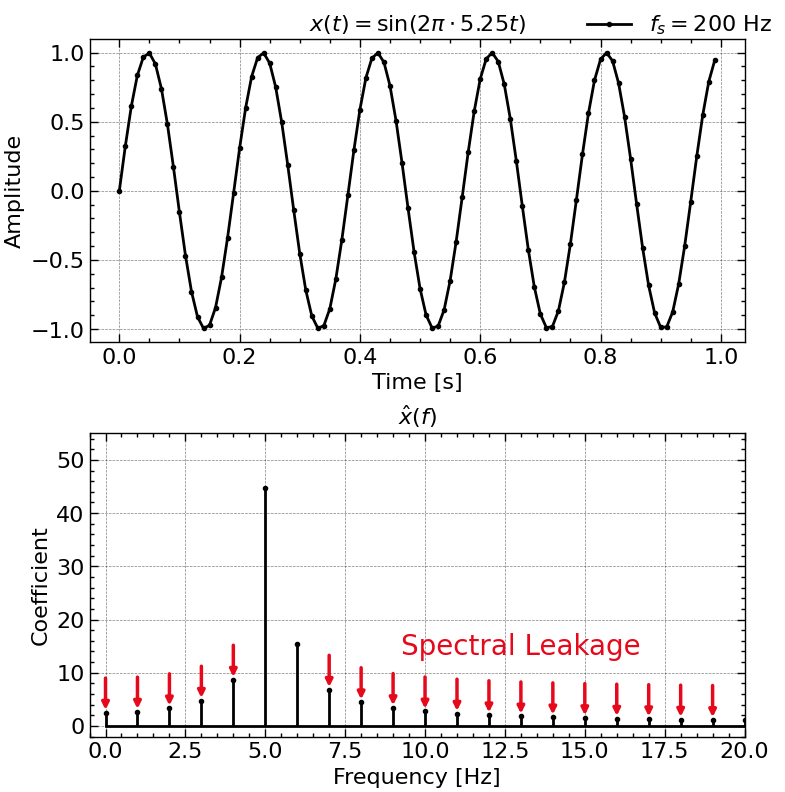

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

N = 100
t = np.linspace(0, 1, N, endpoint=False)

omega0 = 2 * np.pi * 5.25
x = np.sin(omega0 * t)

ax1.plot(t, x, 'ko-', label = '$\mathit{f_s}=$200 Hz')

coefs = np.fft.fft(x)
freq = np.fft.fftfreq(len(t), t[1] - t[0])

pos_mask = freq >= 0
freq = freq[pos_mask]

ax2.stem(freq, np.abs(coefs)[pos_mask], linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')
# ax2.vlines(5.25, 0, 100, color='C1', linestyle='--')

ax1.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5.25 t)$')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude')

ax2.set_title(r'${\hat{x}(f)}$')
ax2.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Coefficient')

ax2.set_xlim(-0.5, 20)
ax2.set_ylim(-2, 55)

ax1.legend(frameon = False, bbox_to_anchor = (0.9, 1.15), loc = 'upper center')

plt.tight_layout()

ax2.text(13, 15., 'Spectral Leakage', fontsize=20, ha='center', va='center', rotation=-0, color='C1', alpha=1.0)

for i in range(0, 20, 1):
    if i not in [5, 6]:
        ax2.annotate('', xy=(freq[i], np.abs(coefs[i])), xytext=(freq[i], np.abs(coefs[i]) + 7),
                        arrowprops=dict(arrowstyle='-|>, head_width = 0.1, head_length = 0.2', lw=2.5, color='C1', alpha=1.0),
                        fontsize=20, ha='center', va='center', rotation=-0, color='C1', alpha=1.0)

# plt.savefig(save_path + 'figure_dft_spectral_leakage' + '.png',bbox_inches='tight',dpi=300)

plt.show()

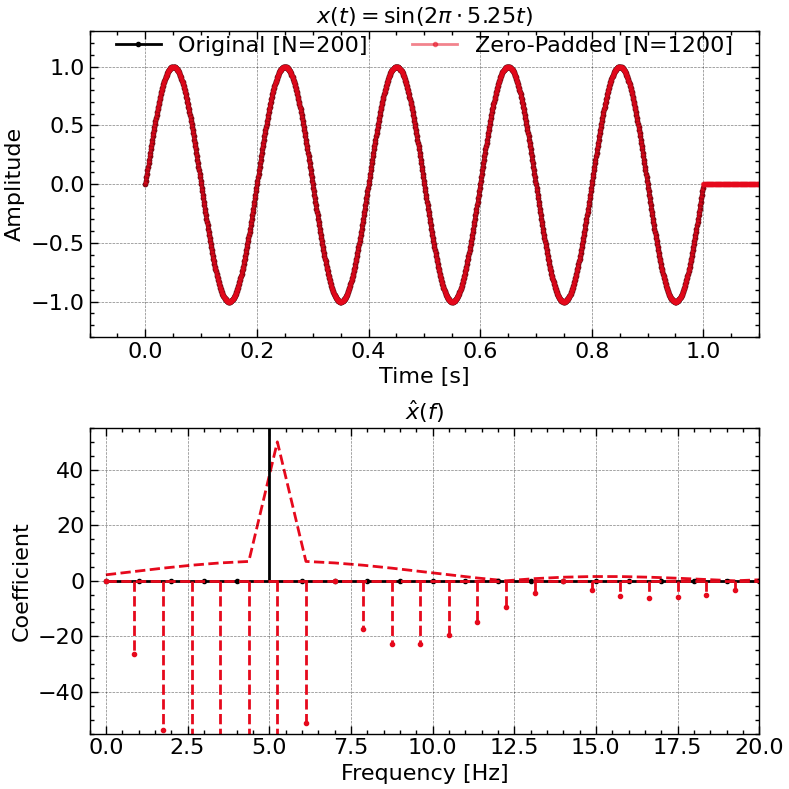

In [117]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

N = 1000
t = np.linspace(0, 1, N, endpoint=False)
dt = t[1] - t[0]
fs = 1 / dt  # Sampling frequency

omega0 = 2 * np.pi * 5.0
x = np.sin(omega0 * t)

ax1.plot(t, x, 'ko-', label = 'Original [N=200]')

coefs = np.fft.fft(x, n = len(t) + 0)
freq = np.fft.fftfreq(len(t), dt)

pos_mask = freq >= 0
freq = freq[pos_mask]

ax2.stem(freq, np.abs(coefs)[pos_mask], linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')

t = np.arange(0, 8 / 7, dt)
x = np.sin(omega0 * t)
x[N:] *= 0

ax1.plot(t, x, 'C1o-', label = f'Zero-Padded [N={t.size}]', alpha = 0.5)

coefs = np.fft.fft(x)
freq = np.fft.fftfreq(len(t), t[1] - t[0])

pos_mask = freq >= 0
freq = freq[pos_mask]

ax2.stem(freq, -np.abs(coefs)[pos_mask], linefmt = 'C1--', markerfmt = 'C1o', basefmt = 'C1--')

ax1.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5.25 t)$')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude')

ax2.set_title(r'${\hat{x}(f)}$')
ax2.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Coefficient')

ax2.plot(freq, 50 * np.abs(np.sinc(np.abs(freq - 5.25))), 'C1--', alpha = 1., zorder = -1)


ax2.set_xlim(-0.5, 20)
ax2.set_ylim(-55, 55)

ax1.grid('on', linestyle = '--')
ax2.grid('on', linestyle = '--')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.05), loc = 'upper center', ncols = 2)

ax1.set_ylim(-1.3, 1.3)
ax1.set_xlim(-0.1, 1.1)

plt.tight_layout()

# plt.savefig(save_path + 'figure_dft_spectral_leakage_zero_padding' + '.png',bbox_inches='tight',dpi=300)

plt.show()

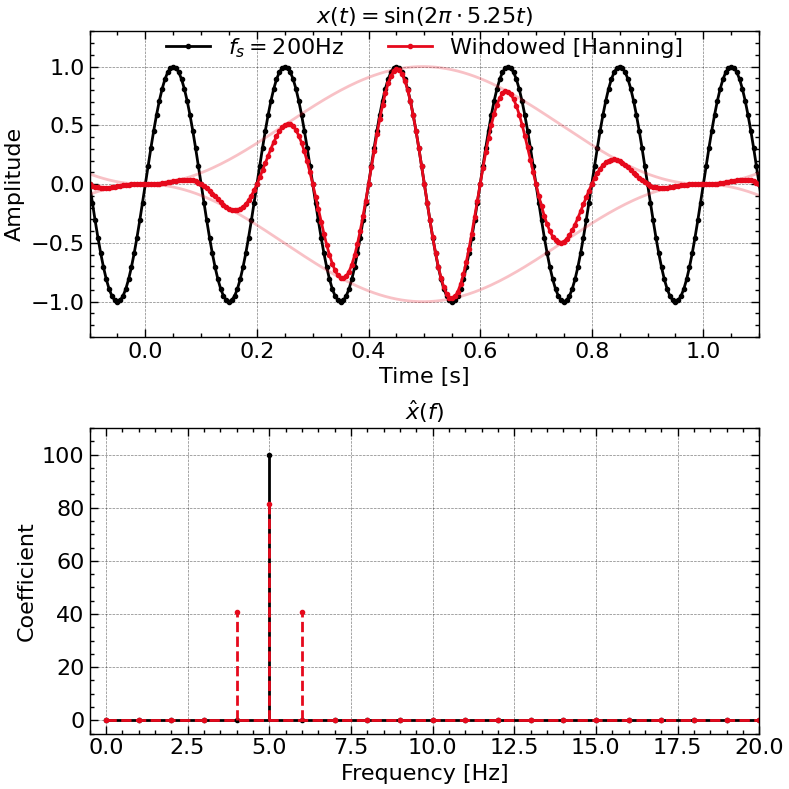

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

omega0 = 2 * np.pi * 5.25

time = np.linspace(0, 1, 200, endpoint=False)
x = np.sin(omega0 * time)

ax1.plot(np.concat([time - 1, time, time + 1]), np.concat([signal, signal, signal]), 'ko-', label = '$\mathit{f_s}=$200Hz')

coefs = np.fft.rfft(signal)
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

ax2.stem(freq, np.abs(coefs), linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')


signal *= np.hanning(np.size(signal))

ax1.plot(time, np.hanning(np.size(signal)), 'C1-', alpha = 0.25)
ax1.plot(time, -np.hanning(np.size(signal)), 'C1-', alpha = 0.25)

ax1.plot(time - 1, np.hanning(np.size(signal)), 'C1-', alpha = 0.25)
ax1.plot(time - 1, -np.hanning(np.size(signal)), 'C1-', alpha = 0.25)

ax1.plot(time + 1, np.hanning(np.size(signal)), 'C1-', alpha = 0.25)
ax1.plot(time + 1, -np.hanning(np.size(signal)), 'C1-', alpha = 0.25)

# ax1.plot(time, signal, 'C1o-', label = 'Windowed [Hanning]')

ax1.plot(np.concat([time - 1, time, time + 1]), np.concat([signal, signal, signal]), 'C1o-', label = 'Windowed [Hanning]')

coefs = np.fft.rfft(signal * np.sqrt(8 / 3))
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

ax2.stem(freq, np.abs(coefs), linefmt = 'C1--', markerfmt = 'C1o', basefmt = 'C1--')



ax1.set_ylim(-1.3, 1.3)

ax1.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5.25 t)$')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude')

ax2.set_title(r'${\hat{x}(f)}$')
ax2.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Coefficient')

ax2.set_xlim(-0.5, 20)
ax2.set_ylim(-5, 110)

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.05), loc = 'upper center', ncols = 2)

ax1.set_ylim(-1.3, 1.3)
ax1.set_xlim(-0.1, 1.1)

plt.tight_layout()

# ax2.text(13, 50., 'Spectral Leakage', fontsize=20, ha='center', va='center', rotation=-0, color='grey', alpha=1.0)

# for i in range(0, 20, 1):
#     if i not in [5, 6]:
#         ax2.annotate('', xy=(freq[i], np.abs(coefs[i])), xytext=(freq[i], np.abs(coefs[i]) + 10),
#                         arrowprops=dict(arrowstyle='->', lw=1.5, color='grey', alpha=1.0),
#                         fontsize=20, ha='center', va='center', rotation=-0, color='grey', alpha=1.0)

# plt.savefig(save_path + 'figure_dft_spectral_leakage_window' + '.png',bbox_inches='tight',dpi=300)

plt.show()

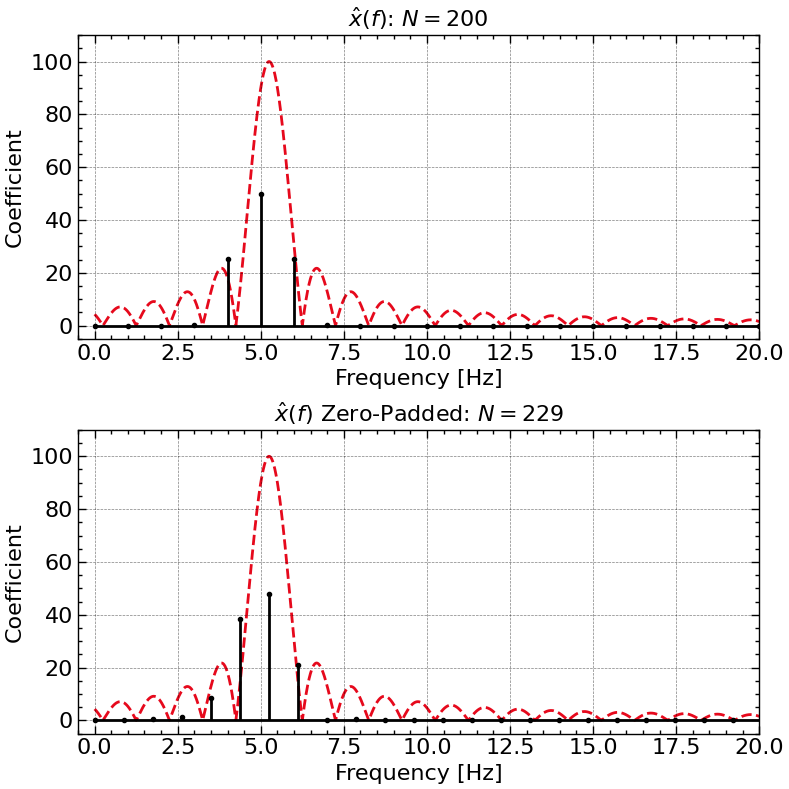

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

omega0 = 2 * np.pi * 5.25

time = np.linspace(0, 1, 200, endpoint=False)
x = np.sin(omega0 * time)


coefs = np.fft.fft(signal)
freq = np.fft.fftfreq(len(time), time[1] - time[0])

pos_mask = freq >= 0

ax1.stem(freq[pos_mask], np.abs(coefs)[pos_mask], linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')


coefs = np.fft.fft(signal, n = 229)
freq = np.fft.fftfreq(len(coefs), time[1] - time[0])

pos_mask = freq >= 0

ax2.stem(freq[pos_mask], np.abs(coefs)[pos_mask], linefmt = 'k', markerfmt = 'ko', basefmt = 'k-')



for ax in [ax1, ax2]:
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('Coefficient')

    ax.set_xlim(-0.5, 20)
    ax.set_ylim(-5, 110)

    ax.grid('on', linestyle = '--')

    _freq = np.linspace(0, 20, 2000)

    ax.plot(_freq, 100 * np.abs(np.sinc(np.abs(_freq - 5.25))), 'C1--', alpha = 1., zorder = -1)

ax1.set_title(r'${\hat{x}(f)}$: ${N=200}$')
ax2.set_title(r'${\hat{x}(f)}$ Zero-Padded: ${N=229}$')

plt.tight_layout()

# plt.savefig(save_path + 'figure_dft_picket_fence_effect' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:48: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:48: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_619265/649139146.py:48: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title('Signal: $\mathrm{sin(2\pi \cdot 5 t)}$')
/tmp/ipykernel_619265/649139146.py:49: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_title('Signal: $\mathrm{sin(2\pi \cdot 5.25 t)}$')


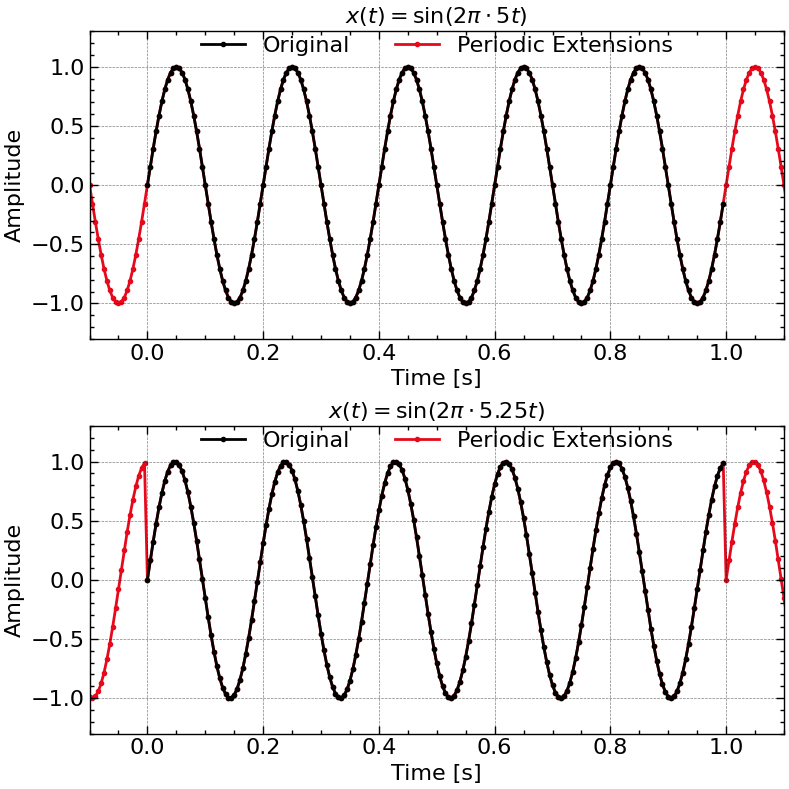

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)


omega0 = 2 * np.pi * 5.0

time = np.linspace(0, 1, 200, endpoint=False)
x = np.sin(omega0 * time)

ax1.plot(time, signal, 'ko-', label = 'Original')

time = np.concatenate((time - 1, time, time + 1))
x = np.concatenate((signal, signal, signal))

ax1.plot(time, signal, 'C1o-', label = 'Periodic Extensions', zorder = -1)


omega0 = 2 * np.pi * 5.25

time = np.linspace(0, 1, 200, endpoint=False)
x = np.sin(omega0 * time)

ax2.plot(time, signal, 'ko-', label = 'Original')

time = np.concatenate((time - 1, time, time + 1))
x = np.concatenate((signal, signal, signal))

ax2.plot(time, signal, 'C1o-', label = 'Periodic Extensions', zorder = -1)


for ax in [ax1, ax2]:
    ax.set_ylim(-1.3, 1.3)
    ax.set_xlim(-0.1, 1.1)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Amplitude')
    ax.grid('on', linestyle = '--')
    ax.legend(frameon = False, bbox_to_anchor = (0.5, 1.05), loc = 'upper center', ncols = 2)

ax1.set_title('Signal: $\mathrm{sin(2\pi \cdot 5 t)}$')
ax2.set_title('Signal: $\mathrm{sin(2\pi \cdot 5.25 t)}$')

ax1.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5 t)$')
ax2.set_title(r'$x(t) =\mathrm{sin}(2\pi \cdot 5.25 t)$')

plt.tight_layout()


plt.savefig(save_path + 'figure_dft_periodic_extensions' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:57: SyntaxWarning: invalid escape sequence '\m'
<>:65: SyntaxWarning: invalid escape sequence '\p'
<>:66: SyntaxWarning: invalid escape sequence '\p'
<>:57: SyntaxWarning: invalid escape sequence '\m'
<>:65: SyntaxWarning: invalid escape sequence '\p'
<>:66: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_619265/794262073.py:57: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('Signal: $\mathrm{sin(2\pi \cdot 5 t)}$\nCoefficient at 5 Hz')
/tmp/ipykernel_619265/794262073.py:65: SyntaxWarning: invalid escape sequence '\p'
  ax1.text(2e3, 1.5e3, '$\propto f_s$', fontsize=20, ha='center', va='center', rotation=35, color='grey', alpha=1.0)
/tmp/ipykernel_619265/794262073.py:66: SyntaxWarning: invalid escape sequence '\p'
  ax2.text(1e1, 1.5e3, '$\propto T$', fontsize=20, ha='center', va='center', rotation=35, color='grey', alpha=1.0)


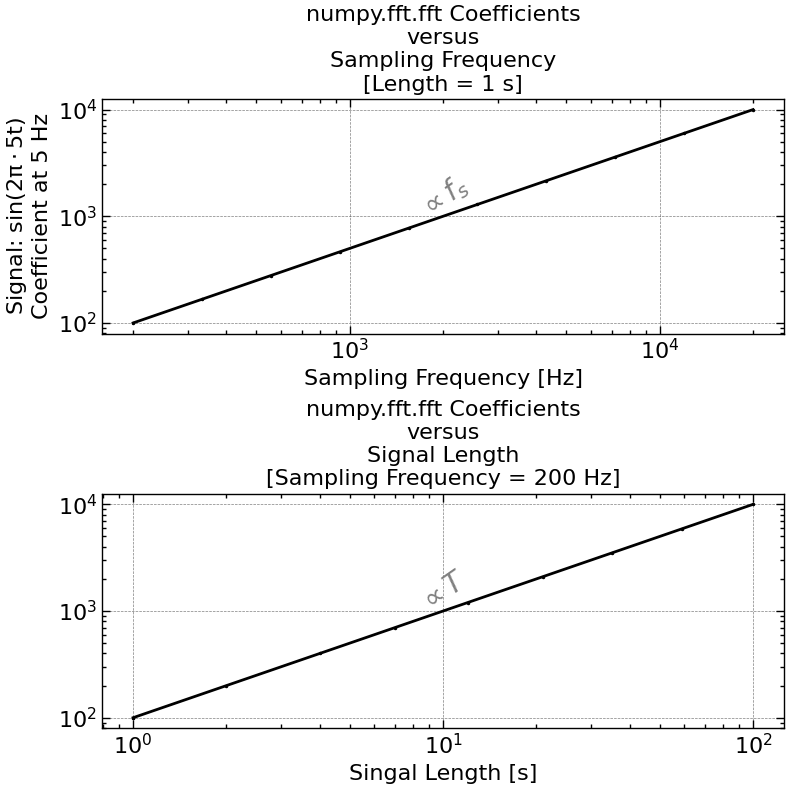

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

omega = 2 * np.pi * 5.0

sampling_frequencies = np.geomspace(200, 20000, 10, dtype=int)

peak_coefs = []
duration = 1

for sampling_frequency in sampling_frequencies:
    time = np.linspace(0, duration, duration * sampling_frequency, endpoint=False)
    x = np.sin(omega * time)
    coefs = np.fft.fft(signal)
    freq = np.fft.fftfreq(len(time), time[1] - time[0])
    peak_coefs.append(np.max(np.abs(coefs)))

ax1.plot(sampling_frequencies, peak_coefs, 'k.-', label = 'Original')
# ax1.plot(sampling_frequencies, peak_coefs / sampling_frequencies, 'r.-', label = 'Normalized by Sampling Frequency')

sampling_frequency = 200
durations = np.geomspace(1, 100, 10, dtype=int)
peak_coefs = []

for duration in durations:
    time = np.linspace(0, duration, duration * sampling_frequency, endpoint=False)
    x = np.sin(omega * time)
    coefs = np.fft.fft(signal)
    freq = np.fft.fftfreq(len(time), time[1] - time[0])
    peak_coefs.append(np.max(np.abs(coefs)))

ax2.plot(durations, peak_coefs, 'k.-', label = 'Original')
# ax2.plot(durations, peak_coefs / durations, 'r.-', label = 'Normalized by $T$')

ax1.set_title('numpy.fft.fft Coefficients\nversus\nSampling Frequency\n[Length = 1 s]')
ax2.set_title('numpy.fft.fft Coefficients\nversus\nSignal Length\n[Sampling Frequency = 200 Hz]')


for ax in [ax1, ax2]:
    ax.grid('on', linestyle = '--')
    ax.set_xscale('log')
    ax.set_yscale('log')
    # ax.legend(frameon = False, bbox_to_anchor = (0.5, 1.0), loc = 'upper center', ncols = 2)

ax1.set_xlabel('Sampling Frequency [Hz]')
ax2.set_xlabel('Singal Length [s]')

ax1.set_ylabel('Signal: $\mathrm{sin(2\pi \cdot 5 t)}$\nCoefficient at 5 Hz')
# ax2.set_ylabel('Coefficient at 5 Hz')

# ax1.set_ylim(2e-1, 6e4)
# ax2.set_ylim(2e-1, 6e4)

plt.tight_layout()

ax1.text(2e3, 1.5e3, '$\propto f_s$', fontsize=20, ha='center', va='center', rotation=35, color='grey', alpha=1.0)
ax2.text(1e1, 1.5e3, '$\propto T$', fontsize=20, ha='center', va='center', rotation=35, color='grey', alpha=1.0)

# plt.savefig(save_path + 'figure_fft_normalization' + '.png',bbox_inches='tight',dpi=300)

plt.show()

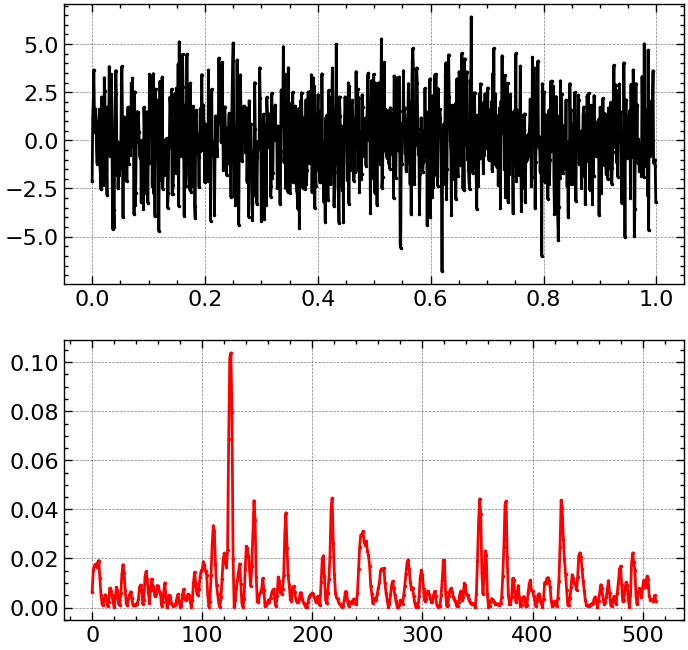

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

omega0 = 2 * np.pi * 125.5
time = np.linspace(0, 1, 2 ** 10, endpoint=False)
fs = 1 / (time[1] - time[0])
x = 1.0 * np.sin(omega0 * time) * (1 - 4 * (time - 0.5) ** 2)
signal += np.random.randn(time.size) * 2.0

ax1.plot(time, signal, 'k.-', label = 'Original')

freq, psd = scipy.signal.welch(signal, fs, window = 'flattop', nperseg=signal.size)
ax2.plot(freq, psd, 'r.-', label = 'Welch')
# ax1.hist(psd, bins=np.linspace(0, 0.02, 32), color='k', alpha=0.5, label = 'Histogram')
# ax1.plot(np.linspace(0, 0.02, 32), 100 * np.exp(-np.linspace(0, 0.02, 32) * 50), 'r--')
# ax2.set_yscale('log')
plt.show()

/tmp/ipykernel_619265/916755038.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend(frameon = False, bbox_to_anchor = (0.5, 1.0), loc = 'upper center', ncol = 1)


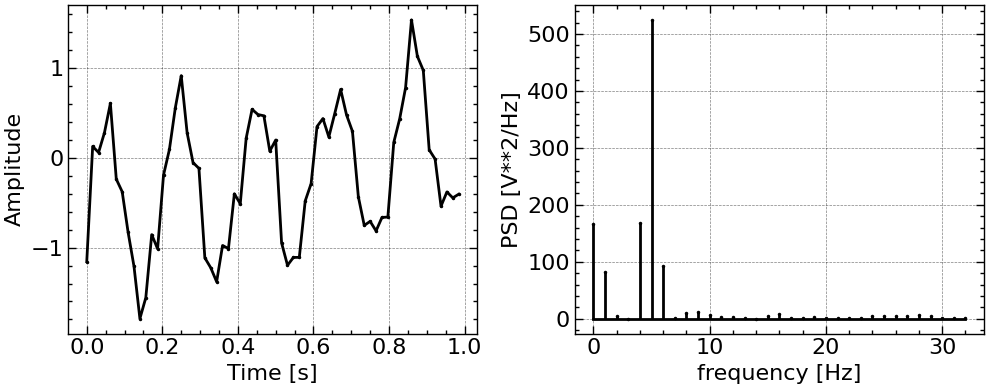

In [ ]:
import scipy.signal
%matplotlib ipympl
plt.close()
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

omega0 = 2 * np.pi * 5

time = np.linspace(0, 1, 2 ** 6, endpoint=False)
omega = np.random.normal(omega0, 0.2 * omega0, time.size)
phase = np.cumsum(omega) * (time[1] - time[0]) + np.random.uniform(0, 2 * np.pi)
x = 1 * (time ** 2 - 0.5) + np.sin(phase) + np.random.randn(time.size) * 0.2
# x = 1 * np.sin(omega0 * time) + np.random.randn(time.size) * 1.0
fs = 1 / (time[1] - time[0])

ax1.plot(time, signal, 'k.-', label = 'Original')

signal *= np.hanning(np.size(signal)) * np.sqrt(8 / 3)
coefs = np.fft.rfft(signal)
freq = np.fft.rfftfreq(len(time), time[1] - time[0])


ax2.stem(freq, np.abs(coefs) ** 2, linefmt = 'k', markerfmt = 'k.', basefmt = 'k-')


ax1.set_ylabel('Amplitude')
ax1.set_xlabel('Time [s]')

ax2.set_xlabel('frequency [Hz]')
ax2.set_ylabel('PSD [V**2/Hz]')

# ax2.set_yscale('log')

ax2.legend(frameon = False, bbox_to_anchor = (0.5, 1.0), loc = 'upper center', ncol = 1)

for ax in [ax1, ax2]:
    ax.grid('on', linestyle = '--')


plt.tight_layout()

plt.show()

In [ ]:
plt.close()
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

omega0 = 2 * np.pi * 5.0
time = np.linspace(0, 1, 2**7, endpoint=False)
fs = 1 / (time[1] - time[0])

N_SAMPLE = 100000
peak_energy = np.zeros(N_SAMPLE)
noise_energy = np.zeros(N_SAMPLE)

for i in range(N_SAMPLE):
    omega = np.random.normal(omega0, 0.0 * omega0, time.size)
    phase = np.cumsum(omega) * (time[1] - time[0]) + np.random.uniform(
        0, 2 * np.pi)
    x = 1 * (time**2 - 0.5) + np.sin(phase) + np.random.randn(
        time.size) * 0.2
    signal *= np.hanning(np.size(signal)) * np.sqrt(8 / 3)
    coefs = np.fft.rfft(signal)
    freq = np.fft.rfftfreq(len(time), time[1] - time[0])

    noise_energy[i] = (np.abs(coefs)**2)[10] / fs
    peak_energy[i] = (np.abs(coefs)**2)[5] / fs

# h_noise = ax1.hist((noise_energy), bins=np.linspace(0, 1, 256), color='r', alpha=0.5, label = 'Histogram', density = True)
h_noise = ax1.hist(np.log10(noise_energy),
                   bins=np.linspace(-5, 1, 256),
                   color='r',
                   alpha=0.5,
                   label='Histogram',
                   density=True)
h = ax2.hist((peak_energy),
             bins=np.linspace(0, 100, 256),
             color='k',
             alpha=0.5,
             label='Histogram',
             density=True)

lamb = np.mean(noise_energy)

ax1.plot(np.linspace(0, 1, 512),
         h_noise[0][0] * np.exp(-np.linspace(0, 1, 512) / lamb),
         'b--',
         label='Exponential Fit')

phi = np.random.uniform(0, 2 * np.pi, N_SAMPLE)
u = np.random.normal(0, 1, N_SAMPLE) * np.sqrt(lamb / 2)
v = np.random.normal(0, 1, N_SAMPLE) * np.sqrt(lamb / 2)
x0 = 4.58

# x0 = 4.50

ax1.hist((u**2 + v**2),
         bins=np.linspace(0, 1, 256),
         color='g',
         alpha=0.5,
         label='Gaussian Fit',
         density=True)

ax2.hist(x0**2 + 2 * x0 * (u * np.cos(phi) + v * np.sin(phi)) + (u**2 + v**2),
         bins=np.linspace(0, 100, 256),
         color='g',
         alpha=0.5,
         label='Gaussian Fit',
         density=True)

# ax1.set_xlim(0, 1)
plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\m'
<>:28: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_619265/2790400688.py:28: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('PSD [$\mathrm{Arb^2/Hz}$]')


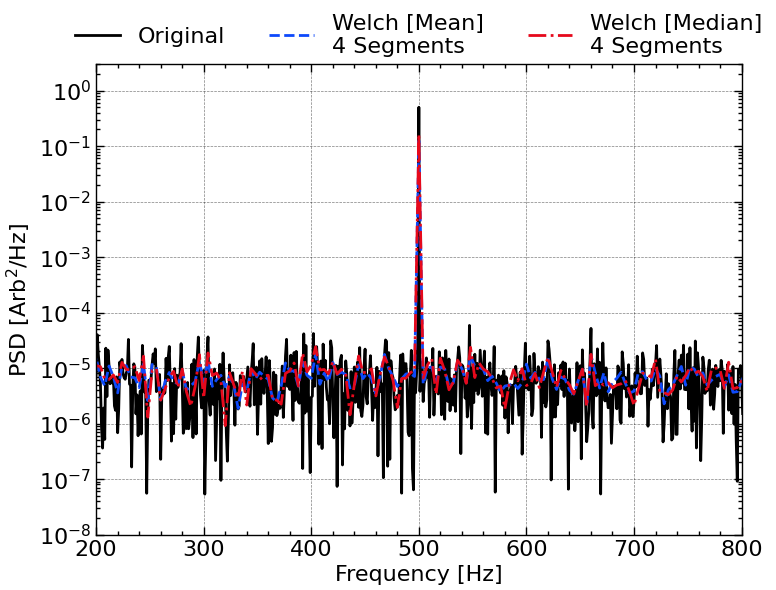

In [ ]:
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)


N = 2 ** 14
N_SEG = 4
omega0 = 2 * np.pi * 500.0
time = np.linspace(0, 1, N, endpoint=False)
x = 1 * np.sin(omega0 * time) + np.random.randn(time.size) * 0.25

freq, psd_mean = scipy.signal.welch(signal, fs, window = 'boxcar', nperseg=N)
ax1.plot(freq[1:], psd_mean[1:], label='Original', color = 'k')

freq, psd_mean = scipy.signal.welch(signal, fs, window = 'boxcar', nperseg = N / N_SEG, average='mean')
_, psd_median = scipy.signal.welch(signal, fs, window = 'boxcar', nperseg = N / N_SEG, average='median')


ax1.plot(freq[1:], psd_mean[1:], label= f'Welch [Mean]\n{N_SEG} Segments', color = 'C0')
ax1.plot(freq[1:], psd_median[1:], label=f'Welch [Median]\n{N_SEG} Segments', color = 'C1')

ax1.set_xlabel('Frequency [Hz]')
ax1.set_ylabel('PSD [$\mathrm{Arb^2/Hz}$]')

ax1.set_yscale('log')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.15), loc = 'upper center', ncol = 3)

ax1.set_xlim(200, 800)

ax1.set_ylim(1e-8, 3e0)
plt.tight_layout()

plt.savefig(save_path + 'figure_welch' + '.png',bbox_inches='tight',dpi=300)

plt.show()

/tmp/ipykernel_458590/2812283875.py:71: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(frameon = False, bbox_to_anchor = (0.9, 1.1), loc = 'upper center')


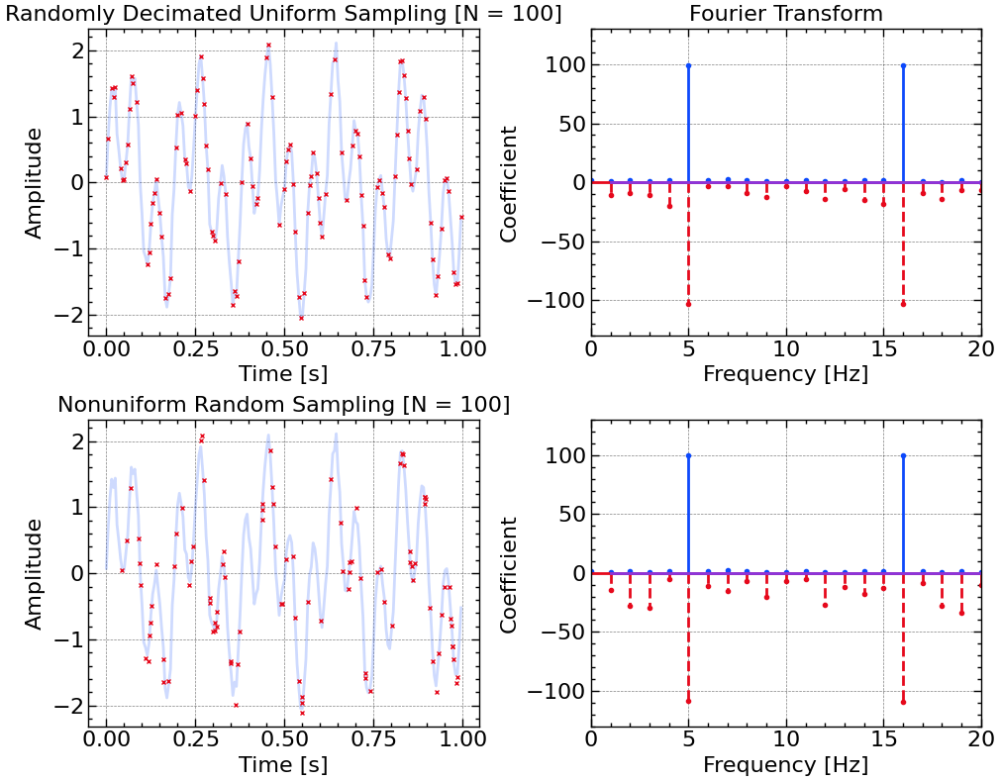

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(10, 8))
ax1 = plt.subplot(2, 2, 1)
ax2 = plt.subplot(2, 2, 2)
ax3 = plt.subplot(2, 2, 3, sharex = ax1, sharey = ax1)
ax4 = plt.subplot(2, 2, 4, sharex = ax2, sharey = ax2)

omega0 = 2 * np.pi * 5.0

time = np.linspace(0, 1, 200, endpoint=False)
fs = 1 / (time[1] - time[0])
x = np.sin(omega0 * time) + np.sin(omega0 * 3.2 * time) + np.random.randn(time.size) * 0.1

ax1.plot(time, signal, '-', alpha = 0.2)
ax3.plot(time, signal, '-', alpha = 0.2)

coefs = np.fft.rfft(signal)
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

ax2.stem(freq, np.abs(coefs), linefmt = '', markerfmt = 'o', basefmt = '-')
ax4.stem(freq, np.abs(coefs), linefmt = '', markerfmt = 'o', basefmt = '-')

data_miss_idx = np.random.randint(0, 200, 100)
# ax1.plot(time[data_miss_idx], signal[data_miss_idx], 'kx', fillstyle = 'none')

signal[data_miss_idx] = np.nan

ax1.plot(time, signal, 'C1x')

ls_amp = np.abs(scipy.signal.lombscargle(time[~np.isnan(signal)], signal[~np.isnan(signal)], 2 * np.pi * freq[1:], normalize='amplitude'))

ax2.stem(freq[1:], -ls_amp * freq.size, 'C1--', label = 'Lomb-Scargle')

time = np.random.uniform(0, 1, 100)
time.sort()
x = np.sin(omega0 * time) + np.sin(omega0 * 3.2 * time) + np.random.randn(time.size) * 0.1
ax3.plot(time, signal, 'C1x')


ls_amp = np.abs(scipy.signal.lombscargle(time[~np.isnan(signal)], signal[~np.isnan(signal)], 2 * np.pi * freq[1:], normalize='amplitude'))

ax4.stem(freq[1:], -ls_amp * freq.size, 'C1--', label = 'Lomb-Scargle')


ax1.set_title('Randomly Decimated Uniform Sampling [N = 100]')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude')

ax3.set_title('Nonuniform Random Sampling [N = 100]')
ax3.set_xlabel('Time [s]')
ax3.set_ylabel('Amplitude')

ax2.set_title('Fourier Transform')
ax2.set_xlabel('Frequency [Hz]')
ax4.set_xlabel('Frequency [Hz]')
ax2.set_ylabel('Coefficient')
ax4.set_ylabel('Coefficient')

ax2.set_xlim(0, 20)
ax4.set_xlim(0, 20)
ax2.set_ylim(-130, 130)

ax1.legend(frameon = False, bbox_to_anchor = (0.9, 1.1), loc = 'upper center')

plt.tight_layout()


plt.savefig(save_path + 'figure_lombscargle' + '.png',bbox_inches='tight',dpi=300)

plt.show()

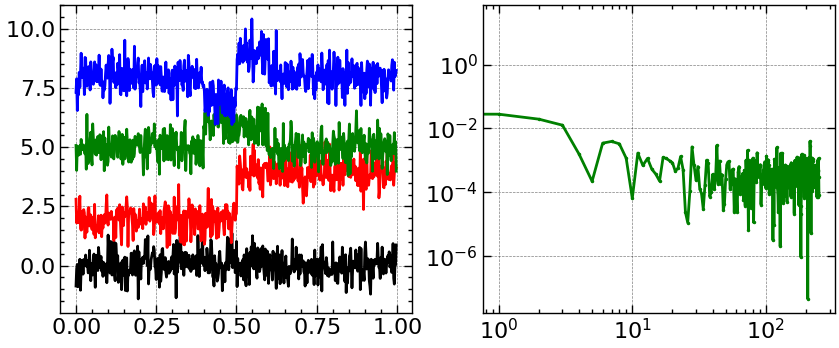

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib ipympl
plt.close()

plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

time = np.linspace(0, 1, 500, endpoint=False)
fs = 1 / (time[1] - time[0])
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

noise = 0.5
signal_1 = 0 + (time == 0.5).astype(float) + np.random.randn(time.size) * noise
signal_2 = 3 + np.sign(time - 0.5) + np.random.randn(time.size) * noise
signal_3 = 5 + (np.abs(time - 0.5) < 0.1).astype(float) + np.random.randn(time.size) * noise
signal_4 = 8 + (np.abs(time - 0.5) < 0.1).astype(float) * np.sign(time - 0.5) + np.random.randn(time.size) * noise

ax1.plot(time, signal_1, 'k-')
ax1.plot(time, signal_2, 'r-')
ax1.plot(time, signal_3, 'g-')
ax1.plot(time, signal_4, 'b-')


coef_1 = np.fft.rfft(signal_1, axis=-1).T
psd_1 = (np.abs(coef_1) ** 2) / fs / time.size

coef_2 = np.fft.rfft(signal_2, axis=-1).T
psd_2 = (np.abs(coef_2) ** 2) / fs / time.size

coef_3 = np.fft.rfft(signal_3, axis=-1).T
psd_3 = (np.abs(coef_3) ** 2) / fs / time.size

coef_4 = np.fft.rfft(signal_4, axis=-1).T
psd_4 = (np.abs(coef_4) ** 2) / fs / time.size

# ax2.plot(freq, psd_1, 'k.-', label = 'Impulse')
# ax2.plot(freq, psd_2, 'r.-', label = 'Step')
ax2.plot(freq, psd_3, 'g.-', label = 'Boxcar')
# ax2.plot(freq, psd_4, 'b.-', label = 'Ramp')

ax2.set_xscale('log')
ax2.set_yscale('log')

plt.show()

<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:58: SyntaxWarning: invalid escape sequence '\p'
<>:59: SyntaxWarning: invalid escape sequence '\p'
<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:58: SyntaxWarning: invalid escape sequence '\p'
<>:59: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_458590/3202686621.py:54: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('PSD [$\mathrm{V^2/Hz}$]')
/tmp/ipykernel_458590/3202686621.py:58: SyntaxWarning: invalid escape sequence '\p'
  ax1.text(50, 1e2, '${\propto f^2}$', fontsize=20, rotation = 20, ha='center', va='center', color='purple', alpha=1.0)
/tmp/ipykernel_458590/3202686621.py:59: SyntaxWarning: invalid escape sequence '\p'
  ax1.text(50, 3e-12, '${\propto 1/f^{2}}$', fontsize=20, rotation = -20, ha='center', va='center', color='brown', alpha=1.0)


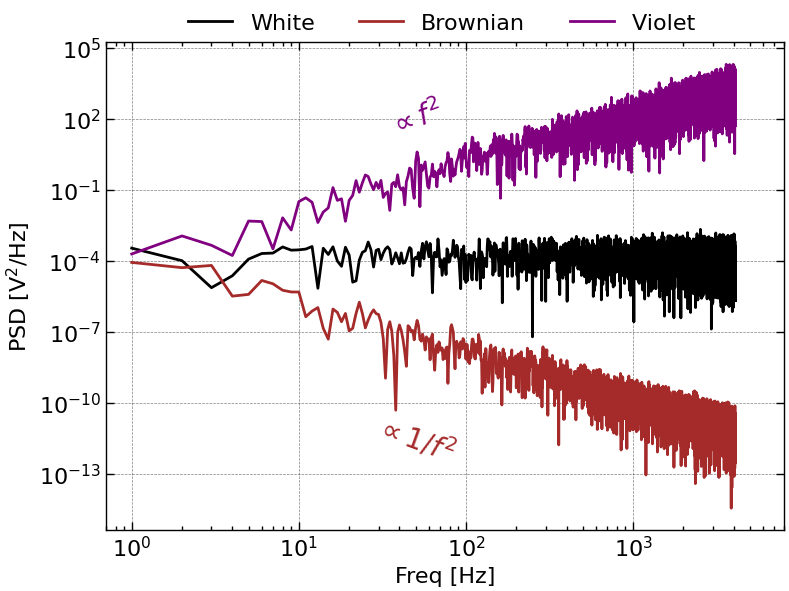

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)

N = 2 ** 13
time = np.linspace(0, 1, N, endpoint=False)
fs = 1 / (time[1] - time[0])
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

noise_white = np.random.randn(time.size)

coef_white = np.fft.rfft(noise_white, axis=-1).T
psd_white = (np.abs(coef_white) ** 2) / fs / time.size

noise_brownian_fft = np.fft.rfft(np.random.randn(time.size))
noise_brownian_fft[1:] /= freq[1:] ** 1
noise_brownian_fft[0] = 0
noise_brownian = np.fft.irfft(noise_brownian_fft)

coef_brownian = np.fft.rfft(noise_brownian, axis=-1).T
psd_brownian = (np.abs(coef_brownian) ** 2) / fs / time.size

noise_violet_fft = np.fft.rfft(np.random.randn(time.size))
noise_violet_fft[1:] /= freq[1:] ** -1
noise_violet_fft[0] = 0
noise_violet = np.fft.irfft(noise_violet_fft)

coef_violet = np.fft.rfft(noise_violet, axis=-1).T
psd_violet = (np.abs(coef_violet) ** 2) / fs / time.size


freq, psd_white = scipy.signal.welch(noise_white, fs, nperseg=N)
freq, psd_brownian = scipy.signal.welch(noise_brownian, fs, nperseg=N)
freq, psd_violet = scipy.signal.welch(noise_violet, fs, nperseg=N)

ax1.plot(freq[1:], psd_white[1:], 'k-', label = 'White')
ax1.plot(freq[1:], psd_brownian[1:], color = 'brown', linestyle = '-', label = 'Brownian')
ax1.plot(freq[1:], psd_violet[1:], color = 'purple', linestyle = '-', label = 'Violet ')

ax1.set_yscale('log')
ax1.set_xscale('log')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.1), loc = 'upper center', ncol = 5)

ax1.set_xlabel('Freq [Hz]')
ax1.set_ylabel('PSD [$\mathrm{V^2/Hz}$]')

plt.tight_layout()

ax1.text(50, 1e2, '${\propto f^2}$', fontsize=20, rotation = 20, ha='center', va='center', color='purple', alpha=1.0)
ax1.text(50, 3e-12, '${\propto 1/f^{2}}$', fontsize=20, rotation = -20, ha='center', va='center', color='brown', alpha=1.0)
ax1.set_xlim(0.7, 8e3)

plt.savefig(save_path + 'figure_noise' + '.png',bbox_inches='tight',dpi=300)

plt.show()

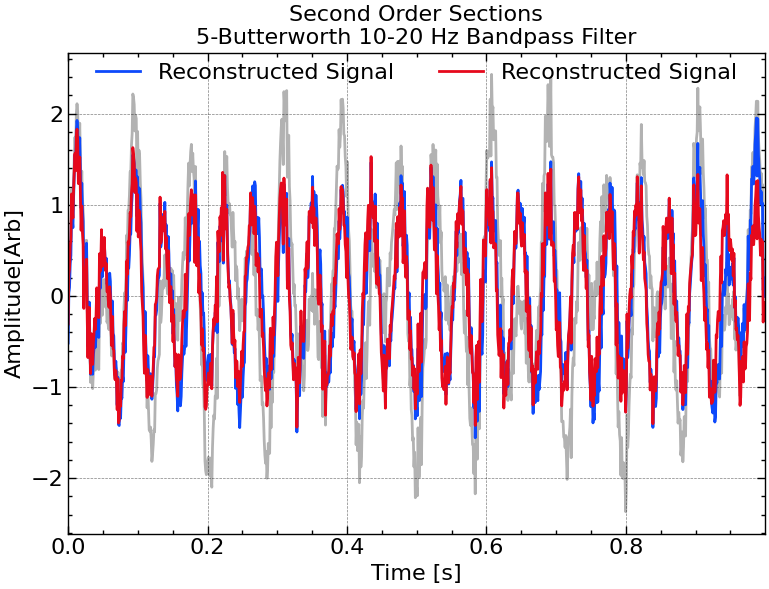

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)
N = 2 ** 10
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt

omega1 = 2 * np.pi * 13.5
omega2 = 2 * np.pi * 23.5

x = np.sin(omega1 * time) + np.sin(omega2 * time) + np.random.randn(time.size) * 0.2

ax1.plot(time, signal, 'k-', alpha = 0.3)

coef = np.fft.rfft(signal, axis=-1).T
freq = np.fft.rfftfreq(len(time), dt)
coef[(freq - 13.5) ** 2 < 2 ** 2] = 0
filtered_x = np.fft.irfft(coef, n = N)

ax1.plot(time, filtered_signal, 'C0-', label = 'Reconstructed Signal')

sos = scipy.signal.butter(1, [11.5, 15.5], btype = 'bandstop', output='sos', fs = fs)
filtered_x = scipy.signal.sosfilt(sos, signal)

ax1.plot(time, filtered_signal, 'C1-', label = 'Reconstructed Signal')


ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.02), loc = 'upper center', ncol = 2)
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude[Arb]')
ax1.set_title('Second Order Sections\n5-Butterworth 10-20 Hz Bandpass Filter')
plt.tight_layout()
ax1.autoscale(axis = 'x', tight= True)

# plt.savefig(save_path + 'figure_cut_freq' + '.png',bbox_inches='tight',dpi=300)

plt.show()

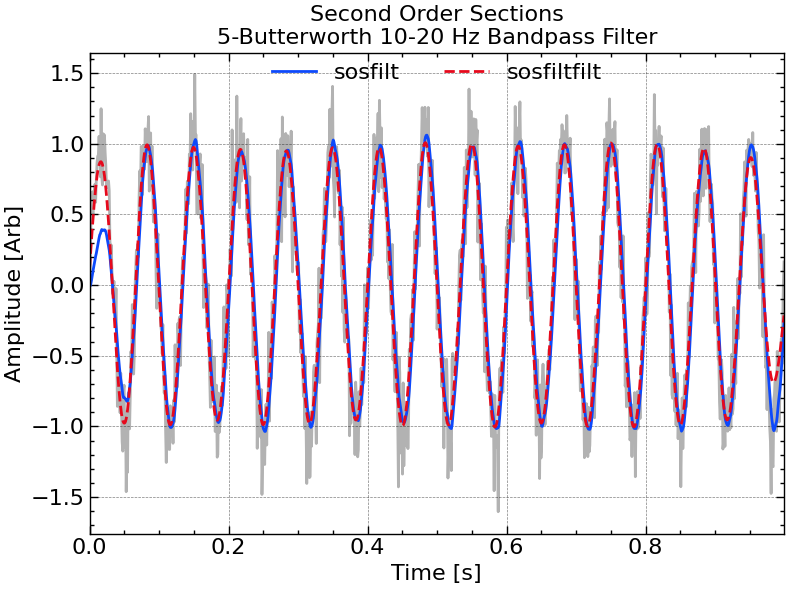

In [122]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)
N = 2 ** 10
time = np.linspace(0, 1, N, endpoint=False)
fs = 1 / (time[1] - time[0])
omega = 2 * np.pi * 15.0
x = np.sin(omega * time) + np.random.randn(time.size) * 0.2

ax1.plot(time, x, 'k-', alpha = 0.3)

sos = scipy.signal.butter(1, [10, 20], btype = 'bandpass', output='sos', fs = fs)
filtered_x = scipy.signal.sosfilt(sos, x)
ax1.plot(time, filtered_x, 'C0', label = 'sosfilt')

filtered_x = scipy.signal.sosfiltfilt(sos, x)
ax1.plot(time, filtered_x, 'C1', label = 'sosfiltfilt')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.02), loc = 'upper center', ncol = 2)
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')
ax1.set_title('Second Order Sections\n5-Butterworth 10-20 Hz Bandpass Filter')
plt.tight_layout()
ax1.autoscale(axis = 'x', tight= True)

plt.savefig(save_path + 'figure_filtered_signal' + '.png',bbox_inches='tight',dpi=300)

plt.show()

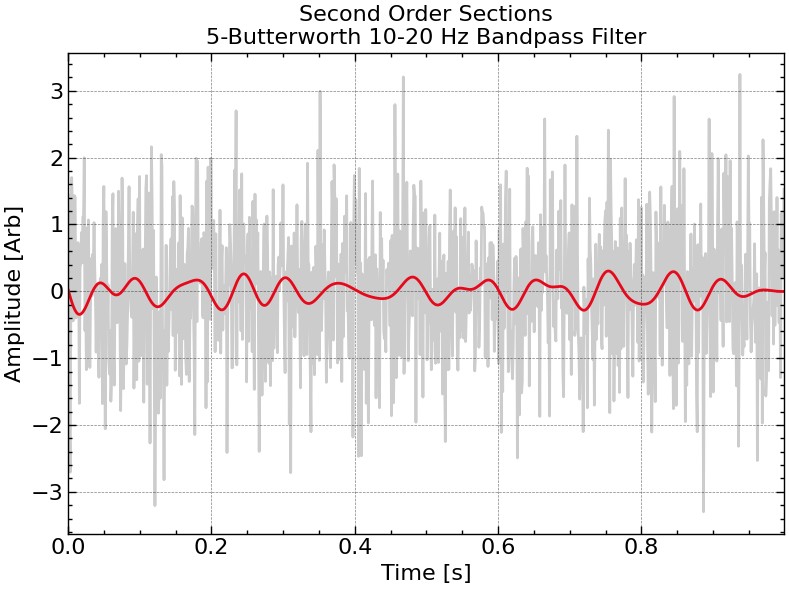

In [123]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)
N = 2 ** 10
time = np.linspace(0, 1, N, endpoint=False)
fs = 1 / (time[1] - time[0])
x = np.random.randn(time.size)

ax1.plot(time, x, 'k-', alpha = 0.2)

sos = scipy.signal.butter(5, [10, 20], btype = 'bandpass', output='sos', fs = fs)

filtered_x = scipy.signal.sosfiltfilt(sos, x)
ax1.plot(time, filtered_x, 'C1-', label = 'Filtered')

ax1.set_title('Second Order Sections\n5-Butterworth 10-20 Hz Bandpass Filter')
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')
plt.tight_layout()
ax1.autoscale(axis = 'x', tight= True)
plt.savefig(save_path + 'figure_filtered_noise' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\p'
<>:48: SyntaxWarning: invalid escape sequence '\p'
<>:43: SyntaxWarning: invalid escape sequence '\m'
<>:47: SyntaxWarning: invalid escape sequence '\p'
<>:48: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_458590/3588229174.py:43: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('PSD [$\mathrm{V^2/Hz}$]')
/tmp/ipykernel_458590/3588229174.py:47: SyntaxWarning: invalid escape sequence '\p'
  ax1.text(50, 1e2, '${\propto f^2}$', fontsize=20, rotation = 20, ha='center', va='center', color='purple', alpha=1.0)
/tmp/ipykernel_458590/3588229174.py:48: SyntaxWarning: invalid escape sequence '\p'
  ax1.text(50, 3e-12, '${\propto 1/f^{2}}$', fontsize=20, rotation = -20, ha='center', va='center', color='brown', alpha=1.0)


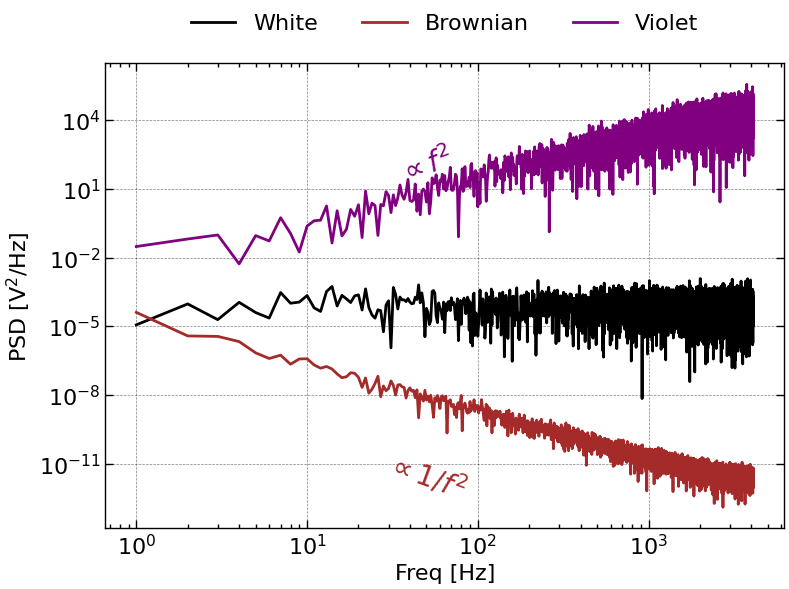

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)

N = 2 ** 13
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

noise_white = np.random.randn(time.size)
coef_white = np.fft.rfft(noise_white, axis=-1).T
psd_white = (np.abs(coef_white) ** 2) / fs / time.size

noise_brownian = np.cumsum(np.random.randn(time.size)) * dt
coef_brownian = np.fft.rfft(noise_brownian, axis=-1).T
psd_brownian = (np.abs(coef_brownian) ** 2) / fs / time.size

noise_violet = np.diff(np.random.randn(time.size + 1)) / dt
coef_violet = np.fft.rfft(noise_violet, axis=-1).T
psd_violet = (np.abs(coef_violet) ** 2) / fs / time.size

ax1.plot(freq[1:], psd_white[1:], 'k-', label = 'White')
ax1.plot(freq[1:], psd_brownian[1:], color = 'brown', linestyle = '-', label = 'Brownian')
ax1.plot(freq[1:], psd_violet[1:], color = 'purple', linestyle = '-', label = 'Violet')

# ax1.plot(freq[1:], np.ones_like(freq[1:]) / fs, 'k--', alpha = 0.5, zorder = 1)

ax1.set_yscale('log')
ax1.set_xscale('log')

ax1.grid('on', linestyle = '--', alpha = 0.5)

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.15), loc = 'upper center', ncol = 5)

ax1.set_xlabel('Freq [Hz]')
ax1.set_ylabel('PSD [$\mathrm{V^2/Hz}$]')

plt.tight_layout()

ax1.text(50, 1e2, '${\propto f^2}$', fontsize=20, rotation = 20, ha='center', va='center', color='purple', alpha=1.0)
ax1.text(50, 3e-12, '${\propto 1/f^{2}}$', fontsize=20, rotation = -20, ha='center', va='center', color='brown', alpha=1.0)

# plt.savefig(save_path + 'figure_noise' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:36: SyntaxWarning: invalid escape sequence '\s'
<>:44: SyntaxWarning: invalid escape sequence '\m'
<>:36: SyntaxWarning: invalid escape sequence '\s'
<>:44: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_619265/2614075821.py:36: SyntaxWarning: invalid escape sequence '\s'
  ax1.plot(bins, 1 * np.exp(-bins), 'k--', alpha = 0.5, zorder = 1, label = 'PSD/$f_s \sim \chi_2^2$')
/tmp/ipykernel_619265/2614075821.py:44: SyntaxWarning: invalid escape sequence '\m'
  ax.set_xlabel('PSD/$f_s$ [$\mathrm{V^2/Hz^2}$]')


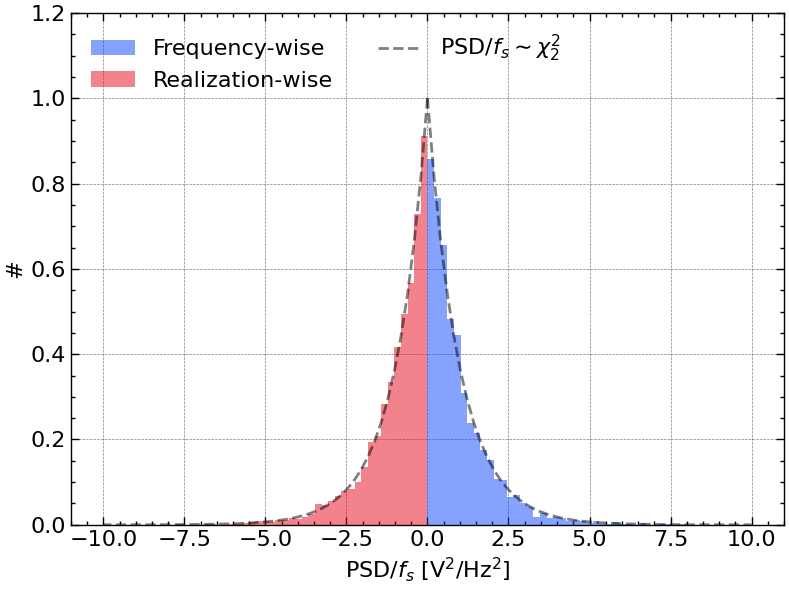

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)

N = 2 ** 13
time = np.linspace(0, 1, N, endpoint=False)
fs = 1 / (time[1] - time[0])
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

noise_white = np.random.randn(time.size)

coef_white = np.fft.rfft(noise_white, axis=-1).T
psd_white = (np.abs(coef_white) ** 2) / fs / time.size

bins = np.linspace(0, 10, 50)

ax1.hist(psd_white[1:] * fs , bins=bins, color='C0', alpha=0.5, density = True, label = f'Frequency-wise')

N_SAMPLE = int(time.size / 2)
psd_white_at_100_Hz = np.zeros(N_SAMPLE)
for i in range(N_SAMPLE):
    noise_white = np.random.randn(time.size)

    coef_white = np.fft.rfft(noise_white, axis=-1).T
    psd_white = (np.abs(coef_white) ** 2) / fs / time.size
    psd_white_at_100_Hz[i] = psd_white[100 + 1]

ax1.hist(-psd_white_at_100_Hz * fs, bins=-bins[::-1], color='C1', alpha=0.5, density = True, label = 'Realization-wise')

ax1.plot(bins, 1 * np.exp(-bins), 'k--', alpha = 0.5, zorder = 1, label = 'PSD/$f_s \sim \chi_2^2$')
ax1.plot(-bins, 1 * np.exp(-bins), 'k--', alpha = 0.5, zorder = 1)


for ax in [ax1]:

    ax.legend(frameon = False, loc = 'upper left', ncol = 2)

    ax.set_xlabel('PSD/$f_s$ [$\mathrm{V^2/Hz^2}$]')
    ax.set_ylabel('#')

ax1.set_ylim(0, 1.2)

plt.tight_layout()


plt.savefig(save_path + 'figure_noise_hist' + '.png',bbox_inches='tight',dpi=300)

plt.show()

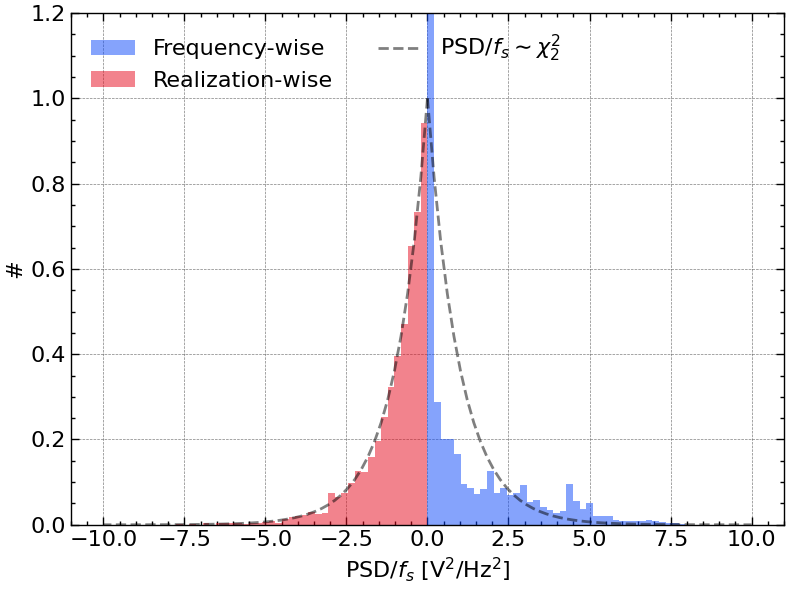

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
import ssqueezepy

plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)

N = 2 ** 13
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

noise_white = np.random.randn(time.size)

bandwidth = 6.0
scales = np.geomspace(30, fs * 600, 128)

coef_bx, scales = ssqueezepy.cwt(noise_white, ('morlet', {'mu': bandwidth}), scales = bandwidth / (2 * np.pi) * scales.astype(np.float32), fs = 1 / dt, l1_norm = False)
psd_white = np.abs(coef_bx) ** 2
psd_white /= np.mean(psd_white, axis=(0, 1), keepdims=True)

bins = np.linspace(0, 10, 50)

ax1.hist(psd_white[:, 3000:-3000].flatten() , bins=bins, color='C0', alpha=0.5, density = True, label = f'Frequency-wise')

N_SAMPLE = int(time.size / 2)
psd_white_at_100_Hz = np.zeros(N_SAMPLE)
for i in range(N_SAMPLE):
    noise_white = np.random.randn(time.size)

    coef_white = np.fft.rfft(noise_white, axis=-1).T
    psd_white = (np.abs(coef_white) ** 2) / fs / time.size
    psd_white_at_100_Hz[i] = psd_white[100 + 1]

ax1.hist(-psd_white_at_100_Hz * fs, bins=-bins[::-1], color='C1', alpha=0.5, density = True, label = 'Realization-wise')

ax1.plot(bins, 1 * np.exp(-bins), 'k--', alpha = 0.5, zorder = 1, label = 'PSD/$f_s \sim \chi_2^2$')
ax1.plot(-bins, 1 * np.exp(-bins), 'k--', alpha = 0.5, zorder = 1)


for ax in [ax1]:

    ax.legend(frameon = False, loc = 'upper left', ncol = 2)

    ax.set_xlabel('PSD/$f_s$ [$\mathrm{V^2/Hz^2}$]')
    ax.set_ylabel('#')

ax1.set_ylim(0, 1.2)

plt.tight_layout()


# plt.savefig(save_path + 'figure_noise_hist' + '.png',bbox_inches='tight',dpi=300)

plt.show()

In [23]:
coef_bx, scales = ssqueezepy.cwt(noise_white, ('morlet', {'mu': bandwidth}), scales = bandwidth / (2 * np.pi) * scales.astype(np.float32), fs = 1 / dt, l1_norm = False)
psd_white = np.abs(coef_bx) ** 2
psd_white /= np.mean(psd_white, axis=(0, 1), keepdims=True)
psd_white.shape

(128, 8192)

<>:45: SyntaxWarning: invalid escape sequence '\m'
<>:45: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_619265/1314421676.py:45: SyntaxWarning: invalid escape sequence '\m'
  ax.set_xlabel('PSD/$f_s$ [$\mathrm{Arb^2/Hz^2}$]')


(np.float64(2.0069761262021855), np.float64(4.2361165337933486e-05), 0, np.float64(0.9977557916259525))
(np.float64(1.8535302317635907), np.float64(13.295588958840247), 0, np.float64(1.0051803701879192))
(np.float64(8.607013980998534), np.float64(41.318833078088026), 0, np.float64(1.1064814507797993))


/tmp/ipykernel_619265/1314421676.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon = False, bbox_to_anchor = (0.5, 1.18), loc = 'upper center', ncol = 1)


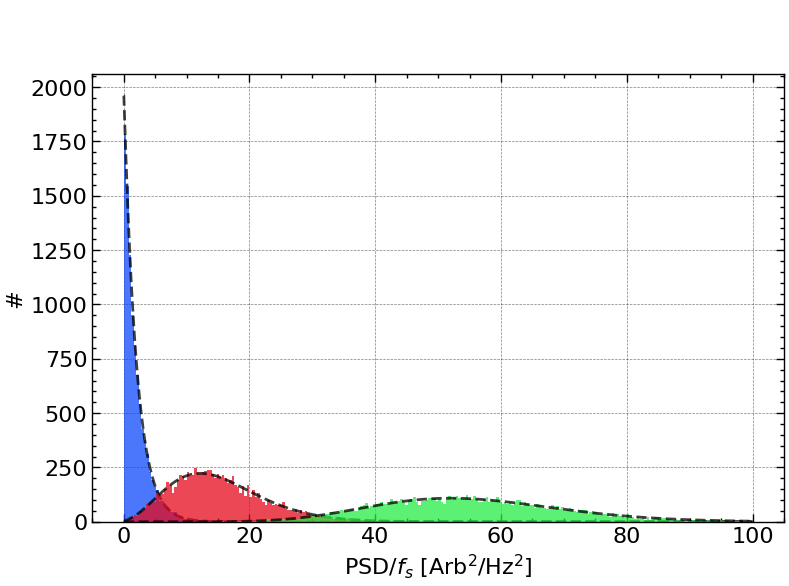

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)

N = 10000

time = np.linspace(0, 1, N, endpoint=False)
fs = 1 / (time[1] - time[0])

omega = 2 * np.pi * 100
freq = np.fft.rfftfreq(len(time), time[1] - time[0])
freq_idx = np.where(freq == omega / (2 * np.pi))[0][0]

bins = np.linspace(0, 100.0, 250, endpoint=False)
bin_width = bins[1] - bins[0]
fined_bins = np.linspace(0, 100, 20000)[1:]


N_SAMPLE = 10000
psd_at_wave_frequency = np.zeros(N_SAMPLE)
amp_x = [0.00, 0.10, 0.20]
amp_noise = [1.00, 1.00, 1.00]

for i in range(3):
    for j in range(N_SAMPLE):
        x = amp_signal[i] * np.sin(omega * time) + amp_noise[i] * np.random.randn(time.size)
        psd = scipy.signal.welch(signal, fs, window='flattop', nperseg=N)
        psd_at_wave_frequency[j] = psd[1][freq_idx]
    ax1.hist(psd_at_wave_frequency * fs, bins = bins, alpha=0.75)

    fit_result = scipy.stats.ncx2.fit(psd_at_wave_frequency * fs, method = 'MLE', floc = 0)
    print(fit_result)
    ax1.plot(fined_bins, N_SAMPLE * bin_width * scipy.stats.ncx2.pdf(fined_bins, *fit_result), 'k--', alpha = 0.75, zorder = 1)

for ax in [ax1]:
    ax.legend(frameon = False, bbox_to_anchor = (0.5, 1.18), loc = 'upper center', ncol = 1)

    ax.set_xlabel('PSD/$f_s$ [$\mathrm{Arb^2/Hz^2}$]')
    ax.set_ylabel('#')

# ax1.set_xlim(0, 68)

plt.tight_layout()
# plt.savefig(save_path + 'figure_noise_hist' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:64: SyntaxWarning: invalid escape sequence '\m'
<>:64: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_909006/1494135668.py:64: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('PSD [$\mathrm{Arb^2/Hz}$]')


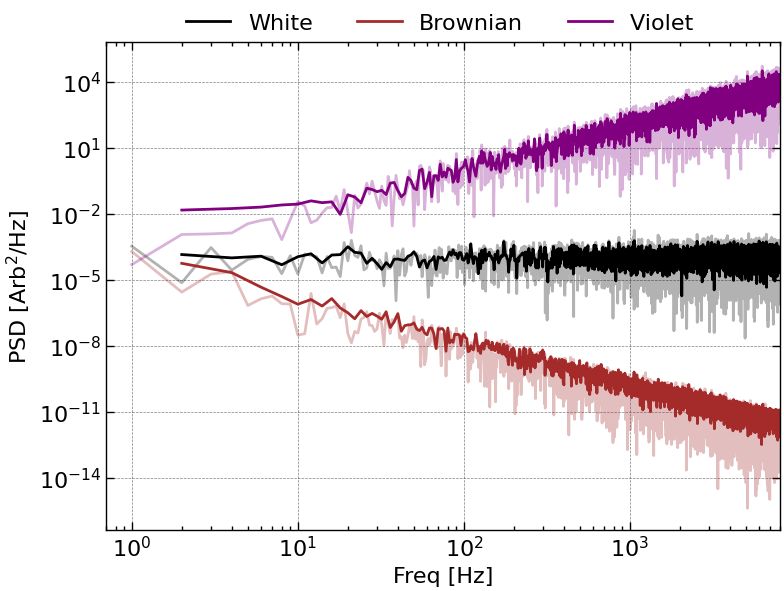

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()
plt.cla()
plt.clf()

ax1 = plt.subplot(1, 1, 1)

N = 2 ** 14
time = np.linspace(0, 1, N, endpoint=False)
fs = 1 / (time[1] - time[0])
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

N_PER_SEG = 2 ** 13
window = 'boxcar'
noise_white = np.random.randn(time.size)

coef_white = np.fft.rfft(noise_white, axis=-1).T
psd_white = (np.abs(coef_white) ** 2) / fs / time.size
psd_white[1:] *= 2  # Adjust for one-sided spectrum

freq_welch, psd_white_welch = scipy.signal.welch(noise_white, fs, window = window, nperseg=N_PER_SEG)

noise_brownian_fft = np.fft.rfft(np.random.randn(time.size))
noise_brownian_fft[1:] /= freq[1:] ** 1
noise_brownian_fft[0] = 0
noise_brownian = np.fft.irfft(noise_brownian_fft)

coef_brownian = np.fft.rfft(noise_brownian, axis=-1).T
psd_brownian = (np.abs(coef_brownian) ** 2) / fs / time.size
psd_brownian[1:] *= 2  # Adjust for one-sided spectrum

freq_welch, psd_brownian_welch = scipy.signal.welch(noise_brownian, fs, window = window, nperseg=N_PER_SEG)

noise_violet_fft = np.fft.rfft(np.random.randn(time.size))
noise_violet_fft[1:] /= freq[1:] ** -1
noise_violet_fft[0] = 0
noise_violet = np.fft.irfft(noise_violet_fft)

coef_violet = np.fft.rfft(noise_violet, axis=-1).T
psd_violet = (np.abs(coef_violet) ** 2) / fs / time.size
psd_violet[1:] *= 2  # Adjust for one-sided spectrum

freq_welch, psd_violet_welch = scipy.signal.welch(noise_violet, fs, window = window, nperseg=N_PER_SEG)

ax1.plot(freq[1:], psd_white[1:], 'k-', alpha = 0.3)
ax1.plot(freq[1:], psd_brownian[1:], color = 'brown', linestyle = '-', alpha = 0.3)
ax1.plot(freq[1:], psd_violet[1:], color = 'purple', linestyle = '-', alpha = 0.3)

ax1.plot(freq_welch[1:], psd_white_welch[1:], 'k-', label = 'White')
ax1.plot(freq_welch[1:], psd_brownian_welch[1:], color = 'brown', linestyle = '-', label = 'Brownian')
ax1.plot(freq_welch[1:], psd_violet_welch[1:], color = 'purple', linestyle = '-', label = 'Violet ')

ax1.set_yscale('log')
ax1.set_xscale('log')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.1), loc = 'upper center', ncol = 5)

ax1.set_xlabel('Freq [Hz]')
ax1.set_ylabel('PSD [$\mathrm{Arb^2/Hz}$]')

plt.tight_layout()

ax1.set_xlim(0.7, 8e3)

# ax1.set_title('Welch Method', y = 1.05)
# plt.savefig(save_path + 'figure_noise_welch' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:53: SyntaxWarning: invalid escape sequence '\m'
<>:53: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_909006/2979951326.py:53: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('PSD [$\mathrm{Arb^2/Hz}$]')


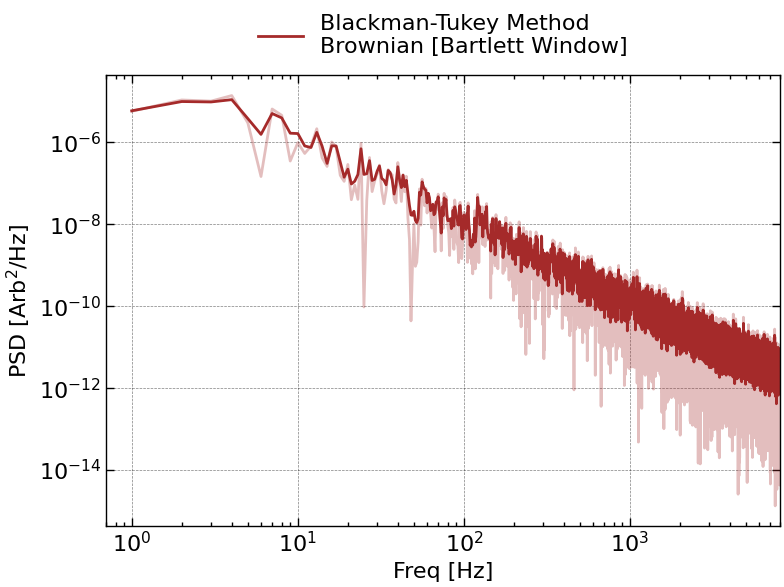

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots

plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()
plt.cla()
plt.clf()

ax1 = plt.subplot(1, 1, 1)

N = 2 ** 14
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

noise_white = np.random.randn(time.size)
coef_white = np.fft.rfft(noise_white, axis=-1).T
psd_white = (np.abs(coef_white) ** 2) / fs / time.size

noise_brownian_fft = np.fft.rfft(np.random.randn(time.size))
noise_brownian_fft[1:] /= freq[1:] ** 1
noise_brownian_fft[0] = 0
noise_brownian = np.fft.irfft(noise_brownian_fft)

freq, psd_brownian = scipy.signal.welch(noise_brownian, fs, window = 'boxcar', nperseg=N)

ax1.plot(freq[1:], psd_brownian[1:], color = 'brown', linestyle = '-', alpha = 0.3)

acf = np.correlate(noise_brownian, noise_brownian, mode='full') / N  # unbiased normalization
acf *= np.bartlett(len(acf))

# From single-sided to two-sided
acf = 2 * acf[acf.size // 2:]
acf[0] *= 0.5

psd = 2 * np.real(np.fft.rfft(acf)) / fs
freq = np.fft.rfftfreq(len(acf), dt)

ax1.plot(freq[1::], psd[1::], 'brown', label = 'Blackman-Tukey Method\nBrownian [Bartlett Window]')

ax1.set_yscale('log')
ax1.set_xscale('log')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.18), loc = 'upper center', ncol = 5)

ax1.set_xlabel('Freq [Hz]')
ax1.set_ylabel('PSD [$\mathrm{Arb^2/Hz}$]')

plt.tight_layout()

ax1.set_xlim(0.7, 8e3)

# ax1.set_title('Welch Method', y = 1.05)
plt.savefig(save_path + 'figure_noise_blackman_tukey' + '.png',bbox_inches='tight',dpi=300)

plt.show()

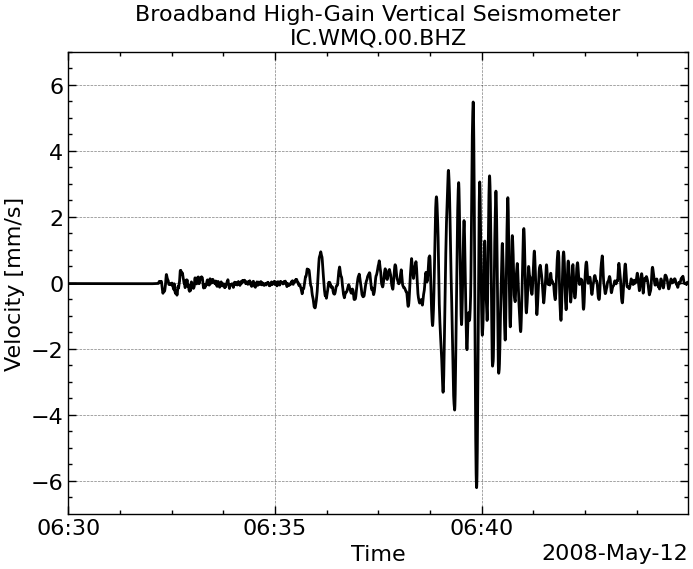

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import scipy.signal
import scienceplots
from obspy import UTCDateTime
from obspy.clients.fdsn import Client
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

# 连接IRIS服务
client = Client("IRIS")

starttime = UTCDateTime("2008-05-12T06:30:00")
endtime = UTCDateTime("2008-05-12T06:45:00")
# 下载波形数据（垂向BHZ）
st = client.get_waveforms(
    network="IC", station="WMQ", location="00", channel="BHZ",
    starttime=starttime,
    endtime=endtime
)


# 下载台站元数据（响应信息）
inv = client.get_stations(
    network="IC", station="WMQ", level="response",
    starttime=starttime,
    endtime=endtime
)
st.remove_response(inventory=inv, output="VEL")  


%matplotlib ipympl
plt.close()
plt.cla()
plt.clf()

ax1 = plt.subplot(1, 1, 1)
dt = 1 / st.traces[0].stats.sampling_rate
time = np.datetime64(starttime) + (np.arange(0, len(st[0].data)).astype(float) * dt * 1e3).astype('timedelta64[ms]')
ax1.plot(time, st[0].data * 1e3, 'k-')
ax1.set_ylim(-6.99, 7)
ax1.set_xlabel('Time')
ax1.set_ylabel('Velocity [mm/s]')
ax1.set_title('Broadband High-Gain Vertical Seismometer\n' + f"{st[0].id}")
ax1.autoscale(axis = 'x', tight = True)
ax1.xaxis.set_major_formatter(mdates.ConciseDateFormatter(ax1.xaxis.get_major_locator()))
plt.show()

<>:49: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_619265/3497229557.py:49: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_ylabel('PSD [$\mathrm{V^2/Hz}$]')


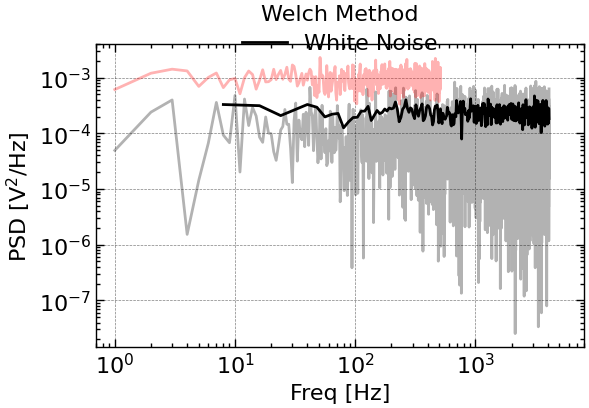

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib ipympl
plt.close()

plt.figure(figsize=(6, 4))
ax1 = plt.subplot(1, 1, 1)

time = np.linspace(0, 1, 2 ** 13, endpoint=False)
fs = 1 / (time[1] - time[0])
freq = np.fft.rfftfreq(len(time), time[1] - time[0])

N_PER_SEG = 2 ** 10
window = 'hann'
noise_white = np.random.randn(time.size)

coef_white = np.fft.rfft(noise_white, axis=-1).T
psd_white = (np.abs(coef_white) ** 2) / fs / time.size

freq_welch, psd_white_welch = scipy.signal.welch(noise_white, fs, window = window, nperseg=N_PER_SEG)

N_DOWNSAMPLE = 2 ** 3
time_downsampled = time[::N_DOWNSAMPLE]
dt_downsampled = time_downsampled[1] - time_downsampled[0]
fs_downsampled = 1 / dt_downsampled
freq_downsampled = np.fft.rfftfreq(len(time_downsampled), dt_downsampled)

psd_downsampled = np.zeros(freq_downsampled.size, dtype = float)

for i in range(N_DOWNSAMPLE):
    _coef = np.fft.rfft(noise_white[i::N_DOWNSAMPLE], axis=-1).T
    _psd = (np.abs(_coef) ** 2) / fs_downsampled / time_downsampled.size
    psd_downsampled += _psd / N_DOWNSAMPLE

ax1.plot(freq[1:], psd_white[1:], 'k-', alpha = 0.3)

ax1.plot(freq_welch[1:], psd_white_welch[1:], 'k-', label = 'White Noise')

ax1.plot(freq_downsampled[1:], psd_downsampled[1:], 'r-', alpha = 0.3)

ax1.set_yscale('log')
ax1.set_xscale('log')

ax1.grid('on', linestyle = '--', alpha = 0.5)

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.1), loc = 'upper center', ncol = 5)

ax1.set_xlabel('Freq [Hz]')
ax1.set_ylabel('PSD [$\mathrm{V^2/Hz}$]')

plt.tight_layout()

ax1.set_xlim(0.7, 8e3)

ax1.set_title('Welch Method', y = 1.05)
# plt.savefig(save_path + 'figure_noise_welch' + '.png',bbox_inches='tight',dpi=300)

plt.show()

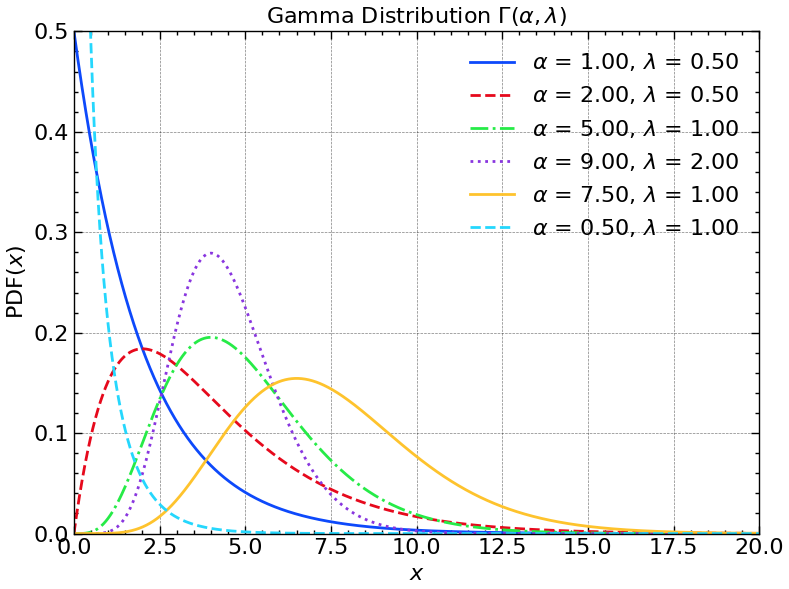

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.special
import scipy.stats
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)
x = np.linspace(0, 20, 100000, endpoint=False)

parameters = [(1.0, 2.0), (2.0, 2.0), (5.0, 1.0), (9.0, 0.5), (7.5, 1.0), (0.5, 1.0)]
colors = ['r', 'orange', 'yellow', 'lime', 'k', 'blue', 'm']

for i in np.arange(len(parameters)):
    alpha = parameters[i][0]
    theta = parameters[i][1]
    color = colors[i]
    pdf = scipy.stats.gamma.pdf(x, alpha, 0, theta)
    pdf[pdf == 0] = np.nan
    # ax1.plot(x, pdf, color = color, linestyle = '-', label = r"$\alpha$ = %.2f, $\lambda$ = %.2f" % (alpha, 1 / theta))
    ax1.plot(x, pdf, color = f"C{i}", label = r"$\alpha$ = %.2f, $\lambda$ = %.2f" % (alpha, 1 / theta))

ax1.legend(frameon = False, loc = 'upper right')

ax1.set_ylim(0, 0.5)
ax1.set_xlim(0, 20)

ax1.set_xlabel('$x$')
ax1.set_ylabel(r'PDF(${x}$)')

ax1.set_title(r'Gamma Distribution $\Gamma(\alpha,\lambda)$')

plt.tight_layout()

plt.savefig(save_path + 'figure_gamma_distribution' + '.png',bbox_inches='tight',dpi=300)

plt.show()

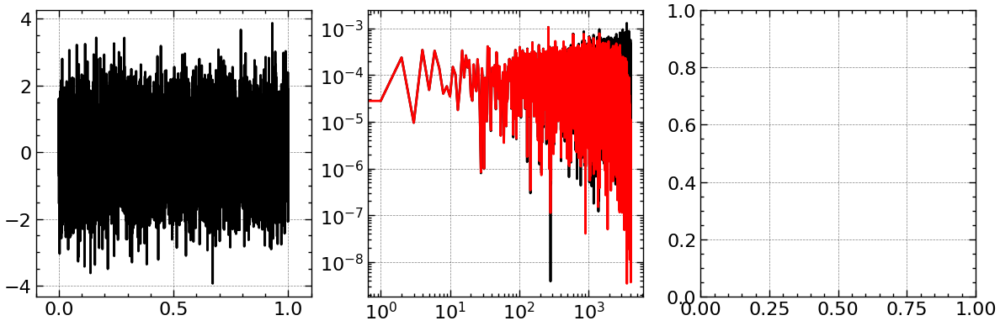

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.special
import scipy.stats
%matplotlib ipympl
plt.close()

plt.figure(figsize=(12, 4))
ax1 = plt.subplot(1, 3, 1)
ax2 = plt.subplot(1, 3, 2)
ax3 = plt.subplot(1, 3, 3)

omega = 2 * np.pi * 25.0
time = np.linspace(0, 1, 2 ** 13, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
freq = np.fft.rfftfreq(len(time), dt)

x = np.sin(omega * time) * 0.0 + np.random.randn(time.size) * 1.0

coef = np.fft.rfft(signal, axis=-1).T
psd = (np.abs(coef) ** 2) / fs / time.size

ax1.plot(time, signal, 'k-')
ax1.set_xlim(-0.1, 1.1)

ax2.plot(freq[1:], psd[1:], 'k-', label = 'FFT')

acfs = np.correlate(signal, signal, mode='full') / signal.size
# acfs = acfs[signal.size - 1:] / signal.size

ax2.plot(freq[:-1], np.real(np.fft.rfft(acfs))[::2] / fs, 'r-', label = 'ACF')

ax2.set_yscale('log')
ax2.set_xscale('log')

for ax in [ax1, ax2, ax3]:
    ax.grid('on', linestyle = '--', alpha = 0.5)
plt.tight_layout()

plt.show()

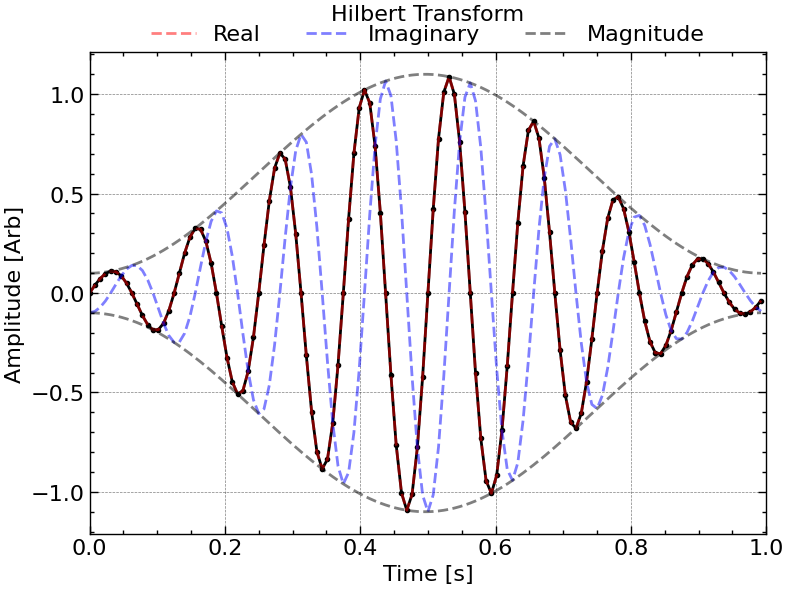

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

ax1 = plt.subplot(1, 1, 1)

omega = 2 * np.pi * 8.0
time = np.linspace(0, 1, 2 ** 7, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
x = np.sin(omega * time) * (0.1 + np.hanning(time.size)) + np.random.randn(time.size) * 0.0

ax1.plot(time, signal, 'ko-')

ax1.plot(time, scipy.signal.hilbert(signal).real, 'r--', label = 'Real', alpha = 0.5)
ax1.plot(time, scipy.signal.hilbert(signal).imag, 'b--', label = 'Imaginary', alpha = 0.5)
ax1.plot(time, np.abs(scipy.signal.hilbert(signal)), 'k--', label = 'Magnitude', alpha = 0.5)
ax1.plot(time, -np.abs(scipy.signal.hilbert(signal)), 'k--', alpha = 0.5)

ax1.set_xlim(-0.0, 1.0)

for ax in [ax1]:
    ax.grid('on', linestyle = '--', alpha = 0.5)

ax1.legend(frameon = False, loc = 'upper center', ncol = 3, bbox_to_anchor = (0.5, 1.1))

ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')
ax1.set_title('Hilbert Transform', y = 1.05)

plt.tight_layout()

# plt.savefig(save_path + 'figure_hilbert' + '.png',bbox_inches='tight',dpi=300)

plt.show()

<>:38: SyntaxWarning: invalid escape sequence '\m'
<>:39: SyntaxWarning: invalid escape sequence '\m'
<>:40: SyntaxWarning: invalid escape sequence '\m'
<>:38: SyntaxWarning: invalid escape sequence '\m'
<>:39: SyntaxWarning: invalid escape sequence '\m'
<>:40: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_619265/2752955776.py:38: SyntaxWarning: invalid escape sequence '\m'
  ax2.plot(time, pca.transform(signal)[:, 0], label = "$\mathbf{n_1}=$" + f"{np.array2string(pca.components_[0], separator = ', ', formatter={'float': lambda x: f'{x: .1f}'})}")
/tmp/ipykernel_619265/2752955776.py:39: SyntaxWarning: invalid escape sequence '\m'
  ax2.plot(time, pca.transform(signal)[:, 1], label = "$\mathbf{n_2}=$" + f"{np.array2string(pca.components_[1], separator = ', ', formatter={'float': lambda x: f'{x: .1f}'})}")
/tmp/ipykernel_619265/2752955776.py:40: SyntaxWarning: invalid escape sequence '\m'
  ax2.plot(time, pca.transform(signal)[:, 2], label = "$\mathbf{n_3}=$" + f"{np.array2

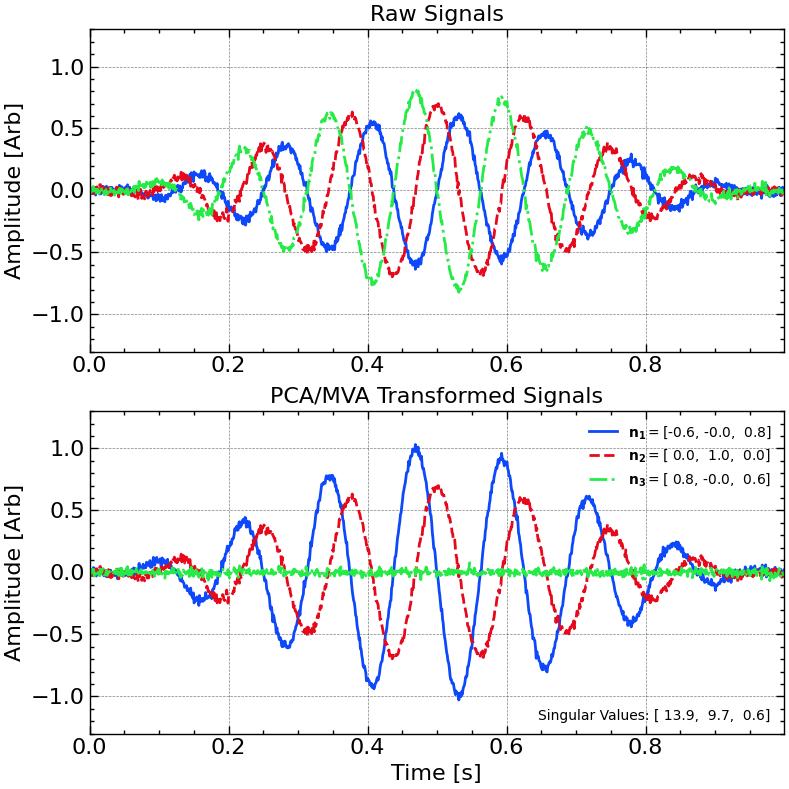

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.decomposition

import scipy.signal
import scienceplots

plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()

plt.figure(figsize=(8, 8))

ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2, sharex = ax1, sharey = ax1)

N = 2 ** 10
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
omega = 2 * np.pi * 8.0

signal_x = np.sin(omega * time + np.pi * 0.0) * (0.6 * np.hanning(time.size)) + np.random.randn(time.size) * 0.02
signal_y = np.sin(omega * time + np.pi * 0.5) * (0.7 * np.hanning(time.size)) + np.random.randn(time.size) * 0.02
signal_z = np.sin(omega * time + np.pi * 1.0) * (0.8 * np.hanning(time.size)) + np.random.randn(time.size) * 0.02

ax1.plot(time, signal_x)
ax1.plot(time, signal_y)
ax1.plot(time, signal_z)

x = np.vstack((signal_x, signal_y, signal_z)).T
pca = sklearn.decomposition.PCA(n_components=3)
pca.fit(signal)

singular_values_ = (pca.singular_values_)

ax2.plot(time, pca.transform(signal)[:, 0], label = "$\mathbf{n_1}=$" + f"{np.array2string(pca.components_[0], separator = ', ', formatter={'float': lambda x: f'{x: .1f}'})}")
ax2.plot(time, pca.transform(signal)[:, 1], label = "$\mathbf{n_2}=$" + f"{np.array2string(pca.components_[1], separator = ', ', formatter={'float': lambda x: f'{x: .1f}'})}")
ax2.plot(time, pca.transform(signal)[:, 2], label = "$\mathbf{n_3}=$" + f"{np.array2string(pca.components_[2], separator = ', ', formatter={'float': lambda x: f'{x: .1f}'})}")

ax2.text(0.98, -1.1, f'Singular Values: {np.array2string(singular_values_, separator = ", ", formatter={"float": lambda x: f"{x: .1f}"})}', ha = 'right', va = 'top', fontsize = 10)

ax2.legend(frameon = False, loc = 'upper right', ncols = 1, fontsize = 10, facecolor = 'white', edgecolor = 'black')
ax2.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')
ax2.set_ylabel('Amplitude [Arb]')

ax1.autoscale(axis = 'x', tight = True)
ax2.autoscale(axis = 'x', tight = True)

ax1.set_ylim(-1.3, 1.3)
ax1.set_title('Raw Signals')
ax2.set_title('PCA/MVA Transformed Signals')

plt.tight_layout()

plt.savefig(save_path + 'figure_pca' + '.png',bbox_inches='tight',dpi=300)

plt.show()

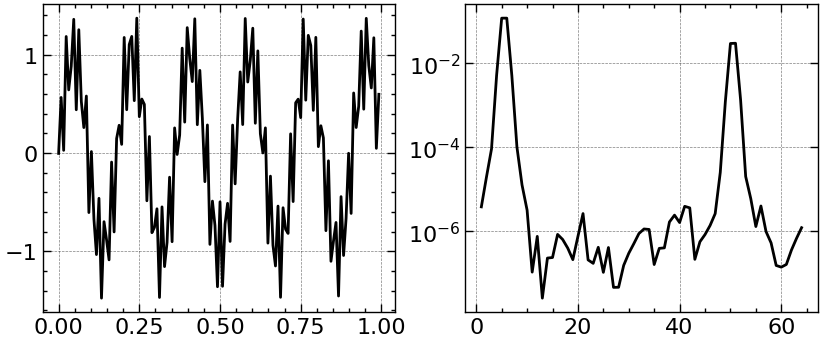

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib ipympl
plt.close()

plt.figure(figsize=(10, 4))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

omega0 = 2 * np.pi * 5.5
omega1 = 2 * np.pi * 50.5
time = np.linspace(0, 1, 2 ** 7, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
x = np.sin(omega0 * time) + 0.5 * np.sin(omega1 * time) + np.random.randn(time.size) * 0.01

ax1.plot(time, signal, 'k-')

signal *= np.hanning(np.size(signal)) * np.sqrt(8 / 3)
coefs = np.fft.rfft(signal, axis=-1).T
psd = (np.abs(coefs) ** 2) / fs / time.size
freq = np.fft.rfftfreq(len(time), dt)
ax2.plot(freq[1:], psd[1:], 'k-', label = 'FFT')

ax2.set_yscale('log')

plt.show()

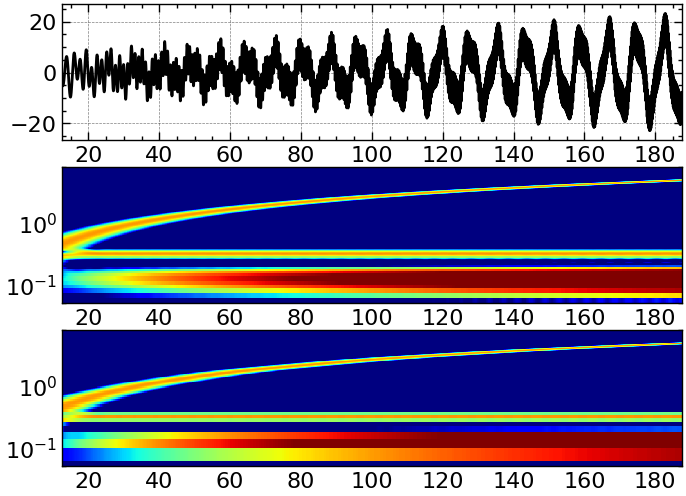

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
%matplotlib ipympl

def wfft_coef_psd(time: np.ndarray, signal: np.ndarray, step: int = 1, window: int = 120):
    """
    Compute short-time Fourier transform (STFT) coefficients and power spectral density (PSD) using a sliding Hanning window.

    Parameters:
    ----------
    time : np.ndarray
        Time vector of shape (Nt,). Can be in seconds or `np.datetime64`.
    signal : np.ndarray
        Input signal of shape (Nt,).
    step : int, optional
        Step size for sliding the window (default is 1).
    window : int, optional
        Window length in samples (default is 120).

    Returns:
    -------
    wtime : np.ndarray
        Center time for each window after sliding.
    freq : np.ndarray
        Frequency vector corresponding to the FFT.
    coef : np.ndarray
        Complex FFT coefficients of shape (Nf, Nt), where Nf is the number of frequencies.
    psd : np.ndarray
        Power spectral density of shape (Nf, Nt).
    wsignal : np.ndarray
        Window-averaged signal of shape (Nt,).

    Notes:
    -----
    - The Hanning window is applied to each segment, and normalization is performed based on Parseval's theorem.
    - The PSD is computed as the squared magnitude of the FFT coefficients, scaled by `2 * dt / window`.
    """

    if isinstance(time[0], np.datetime64):
        elapsed_time = np.array(time).astype('datetime64[ns]').astype('float') / 1e9
    else:
        elapsed_time = np.array(time)

    dt = elapsed_time[1] - elapsed_time[0]

    # Apply sliding window view
    wtime = np.lib.stride_tricks.sliding_window_view(elapsed_time, window)[::step][:, 0] + dt * window / 2
    freq = np.fft.fftfreq(window, dt)[:window // 2]
    freq = np.fft.rfftfreq(window, dt)
    freq = np.abs(freq)
    wx = np.lib.stride_tricks.sliding_window_view(signal, window)[::step]

    # Apply Hanning window and normalize based on Parseval's theorem
    wx = wsignal * np.sqrt(8 / 3) * np.hanning(window)

    coef = np.fft.fft(wsignal, axis=-1)[:, :window // 2].T
    coef = np.fft.rfft(wsignal, axis=-1).T


    psd = (np.abs(coef) ** 2) * dt / window
    
    # Double the PSD values except for the DC component and Nyquist frequency
    if window % 2 == 0:
        psd[1:-1] *= 2
    else:
        psd[1:] *= 2

    if isinstance(time[0], np.datetime64):
        wtime = (np.array(wtime) * 1e9).astype('datetime64[ns]')

    wx = np.mean(wsignal, axis=-1)

    return wtime, freq, coef, psd, wsignal

plt.close()
ax1 = plt.subplot(3, 1, 1)
ax2 = plt.subplot(3, 1, 2, sharex = ax1)
ax3 = plt.subplot(3, 1, 3, sharex = ax1, sharey = ax2)


N = int(2 ** 15)

t = np.linspace(0, 200, N)
dt = t[1] - t[0]
fs = 1 / dt

omega = 0.4

# Generate a signal with 4 components: 
# 1. Sinuoidal; 2. Growing Sinuoidal; 3. Chirping Sinuoidal; 4. White noise

sig = 3 * np.sin(5 * omega * t) + 8 * t / 100 * np.sin(2 * omega * t) + 6 * np.sin(2 * omega * (t + 10) * t / 10)

ax1.plot(t, sig, 'k-', label = 'Signal')

step = 32
window = 4096
mfft = 3 * window

hann_window = scipy.signal.windows.hann(window, sym = True)  # symmetric Gaussian window
STFT = scipy.signal.ShortTimeFFT(hann_window, hop=step, fs = fs, scale_to='psd', fft_mode = 'onesided2X', mfft = mfft)  # create the STFT object
stft_psd = STFT.stft(sig)  # perform the STFT
stft_time = np.arange(0, stft_psd.shape[1]) * STFT.hop / fs - STFT.win.size / 2 / fs  # time vector for STFT
stft_frequency = np.fft.rfftfreq(mfft, d=dt)  # frequency vector for STFT

ax2.pcolormesh(stft_time, stft_frequency, np.log10(np.abs(stft_psd) ** 2), cmap='jet', vmax=2.5, vmin=0.0)

wfft_time, wfft_frequency, wfft_coef, wfft_psd, wfft_avg = wfft_coef_psd(t, sig, step,window)

pc3 = ax3.pcolormesh(wfft_time, wfft_frequency, np.log10(wfft_psd), cmap='jet', vmax=2.5, vmin=0.0)

ax2.set_xlim(wfft_time[0], wfft_time[-1])
ax2.set_ylim(0.05, 8)
ax2.set_yscale('log')



In [ ]:
w = scipy.signal.windows.hann(4096, sym=True)  # symmetric Gaussian window
STFT = scipy.signal.ShortTimeFFT(w, hop=100, fs=fs,
                                 scale_to='psd')  # create the STFT object
stft_psd = STFT.stft(sig)  # perform the STFT
STFT.extent()

TypeError: ShortTimeFFT.extent() missing 1 required positional argument: 'n'

NameError: name 'bn' is not defined

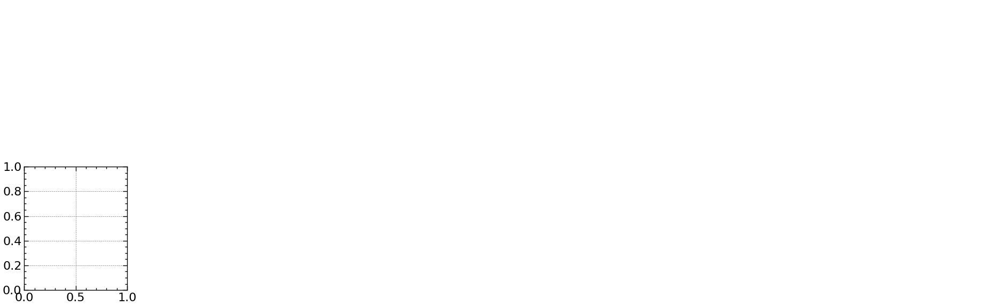

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np

plt.close()
plt.figure(figsize=(6, 3))
ax = plt.subplot(aspect=1.2)

x = np.arange(10)
np.random.shuffle(signal)

width = 0.8
height = 0.6
fontsize = 10
for i in range(len(signal)):
    ax.text(i + width / 2,
            2 + height / 2,
            f"{signal[i]:.1f}",
            fontsize=fontsize,
            color='w',
            weight='bold',
            horizontalalignment='center',
            verticalalignment='center')

    ax.add_patch(
        Rectangle(xy=(i, 2.0),
                  width=width,
                  height=height,
                  facecolor='c',
                  edgecolor='c',
                  lw=2.))

window = 4
ma_np = np.mean(np.lib.stride_tricks.sliding_window_view(signal, window),
                axis=-1)
ma_bn_min_count_window = bn.move_mean(signal, window, min_count=window)
ma_bn_min_count_1 = bn.move_mean(signal, window, min_count=1)

for i in range(len(ma_np)):
    ax.text(i + (window - 1) / 2 + width / 2,
            1 + height / 2,
            f"{ma_np[i]:.1f}",
            fontsize=fontsize,
            color='w',
            weight='bold',
            horizontalalignment='center',
            verticalalignment='center')

    ax.add_patch(
        Rectangle(
            xy=(i + (window - 1) / 2, 1.0),
            width=width,
            height=height,
            facecolor='orange',
            edgecolor='orange',
            lw=2.,
        ))

for i in range(len(ma_bn_min_count_window)):
    ax.text(i + width / 2,
            0 + height / 2,
            f"{ma_bn_min_count_window[i]:.1f}",
            fontsize=fontsize,
            color='w',
            weight='bold',
            horizontalalignment='center',
            verticalalignment='center')

    ax.add_patch(
        Rectangle(xy=(i, 0.0),
                  width=width,
                  height=height,
                  facecolor='m',
                  edgecolor='m',
                  lw=2.))

for i in range(len(ma_bn_min_count_1)):
    ax.text(i + width / 2,
            -1 + height / 2,
            f"{ma_bn_min_count_1[i]:.1f}",
            fontsize=fontsize,
            color='w',
            weight='bold',
            horizontalalignment='center',
            verticalalignment='center')

    ax.add_patch(
        Rectangle(xy=(i, -1.0),
                  width=width,
                  height=height,
                  facecolor='orangered',
                  edgecolor='orangered',
                  lw=2.))

alpha = 0.2
ax.text(2,
        2 + height + 0.2,
        'Window = 4',
        va='bottom',
        ha='center',
        weight='bold',
        alpha=alpha)
ax.fill_between(np.array([-.15, window + (width - 1.0) + 0.1]),
                -0.05 + 2.0 - 0.1,
                -0.0 + 2.0 + height + 0.1,
                color='k',
                edgecolor='none',
                alpha=alpha,
                zorder=-1)
ax.fill_between(1 + np.array([-.1, window + (width - 1.0) + 0.15]),
                0.0 + 2.0 - 0.1,
                0.05 + 2.0 + height + 0.1,
                color='r',
                edgecolor='none',
                alpha=alpha,
                zorder=-1)

# ax.fill_between(1 + np.array([0.0, window + (width - 1.0)]), 2.0 + height + 0.13, 2.0 + height + 0.19, color = 'k', edgecolor = 'none', alpha = 0.1, zorder = -1)
# ax.fill_between(2 + np.array([0.0, window + (width - 1.0)]), 2.0 + height + 0.21, 2.0 + height + 0.27, color = 'k', edgecolor = 'none', alpha = 0.1, zorder = -1)
# ax.fill_between(3 + np.array([0.0, window + (width - 1.0)]), 2.0 + height + 0.29, 2.0 + height + 0.36, color = 'k', edgecolor = 'none', alpha = 0.1, zorder = -1)

ax.text(-0.4,
        2 + height / 2,
        'Input',
        fontsize=fontsize + 2,
        color='c',
        weight='bold',
        va='center',
        ha='right')
ax.text(-0.4,
        1 + height / 2,
        'Numpy',
        fontsize=fontsize + 2,
        color='orange',
        weight='bold',
        va='center',
        ha='right')
ax.text(-0.4,
        0 + height / 2,
        'Bottleneck\nmin_count = 4',
        fontsize=fontsize + 2,
        color='m',
        weight='bold',
        va='center',
        ha='right')
ax.text(-0.4,
        -1 + height / 2,
        'Bottleneck\nmin_count = 1',
        fontsize=fontsize + 2,
        color='orangered',
        weight='bold',
        va='center',
        ha='right')

ax.text(signal.size + 0.2,
        2 + height / 2,
        'N',
        fontsize=fontsize + 2,
        color='k',
        weight='bold',
        va='center',
        ha='left')
ax.text(signal.size + 0.2,
        1 + height / 2,
        'N + 1 - W',
        fontsize=fontsize + 2,
        color='k',
        weight='bold',
        va='center',
        ha='left')
ax.text(signal.size + 0.2,
        0 + height / 2,
        'N',
        fontsize=fontsize + 2,
        color='k',
        weight='bold',
        va='center',
        ha='left')
ax.text(signal.size + 0.2,
        -1 + height / 2,
        'N',
        fontsize=fontsize + 2,
        color='k',
        weight='bold',
        va='center',
        ha='left')

ax.set_title('Moving Average', fontsize=fontsize + 2, weight='bold')
ax.axis('off')
ax.set_xlim(-2.3, 12.0)
ax.set_ylim(-1, 3.3)

plt.show()

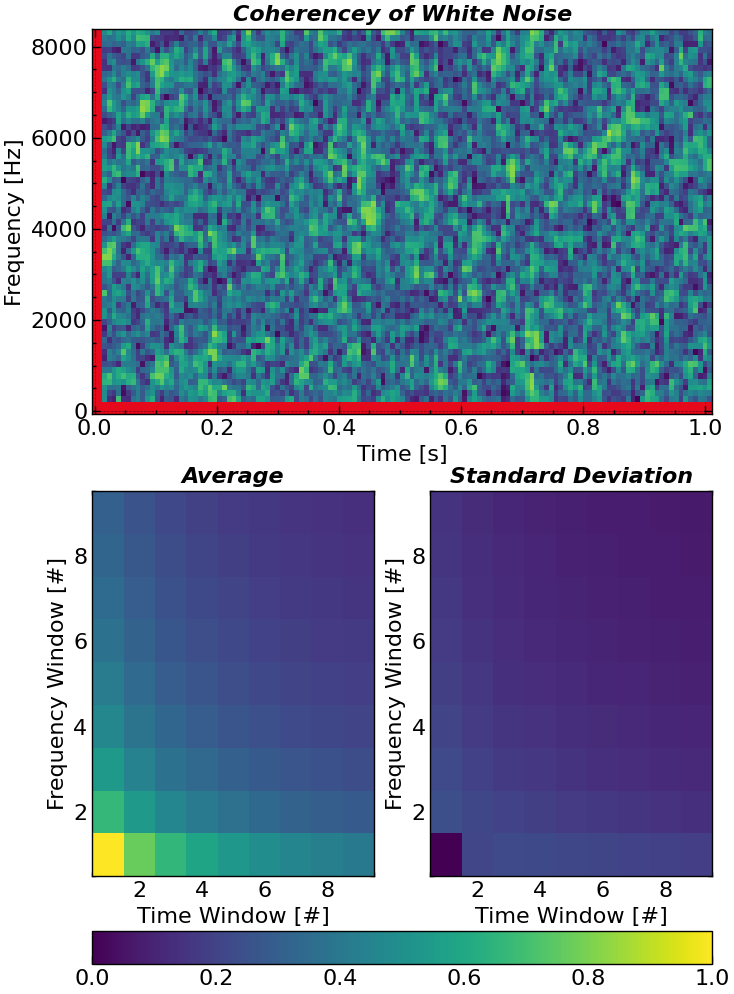

In [280]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import scipy.signal
import matplotlib.ticker as ticker
import bottleneck as bn

plt.close()

plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

plt.figure(figsize=(8, 11))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 2, 3)
ax3 = plt.subplot(2, 2, 4, sharex=ax2, sharey=ax2)

N = 2**14
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
x = np.random.normal(0, 1, (N, 3))
bins = np.linspace(0, 100, 100) * dt

window = 128
step = window
mfft = 1 * window

hann_window = scipy.signal.windows.hann(window,
                                        sym=True)  # symmetric Gaussian window
STFT = scipy.signal.ShortTimeFFT(hann_window,
                                 hop=step,
                                 fs=fs,
                                 scale_to='magnitude',
                                 fft_mode='onesided2X',
                                 mfft=mfft)  # create the STFT object
stft_coef = STFT.stft(x[:, :], axis=0)  # perform the STFT
stft_coef = stft_coef.transpose((2, 0, 1))  # Transpose to (Nf, Nt, Nch) format
stft_matrix = np.einsum(
    'ijk, ijl -> ijkl', stft_coef,
    stft_coef.conj())  # Compute the outer product of the coefficients

tmin, tmax, fmin, fmax = STFT.extent(N)

time = np.linspace(tmin, tmax, stft_matrix.shape[0])
freq = np.linspace(fmin, fmax, stft_matrix.shape[1])

avg_stft_matrix = np.copy(stft_matrix)
time_window = 3
freq_window = 3

avg_stft_matrix = bn.move_mean(avg_stft_matrix,
                               time_window,
                               min_count=time_window,
                               axis=0)
avg_stft_matrix = bn.move_mean(avg_stft_matrix,
                               freq_window,
                               min_count=freq_window,
                               axis=1)

coherency = np.abs(avg_stft_matrix[:, :, 0, 1]) / np.sqrt(
    np.abs(avg_stft_matrix[:, :, 0, 0] * avg_stft_matrix[:, :, 1, 1]))
ax1.pcolormesh(time, freq, coherency.T, cmap='viridis', vmax=1.0, vmin=0.0)
ax1.set_facecolor('C1')

N_TIME_WINDOW = 10
N_FREQ_WINDOW = 10
avg_coherency = np.zeros((N_TIME_WINDOW, N_FREQ_WINDOW))
std_coherency = np.zeros((N_TIME_WINDOW, N_FREQ_WINDOW))

for time_window in np.arange(N_TIME_WINDOW):
    for freq_window in np.arange(N_FREQ_WINDOW):
        avg_stft_matrix = np.copy(stft_matrix)
        if time_window != 0:
            avg_stft_matrix = bn.move_mean(avg_stft_matrix,
                                           time_window,
                                           min_count=time_window,
                                           axis=0)
        if freq_window != 0:
            avg_stft_matrix = bn.move_mean(avg_stft_matrix,
                                           freq_window,
                                           min_count=freq_window,
                                           axis=1)

        avg_coherency[time_window, freq_window] = np.nanmean(
            np.abs(avg_stft_matrix[:, :, 0, 1]) / np.sqrt(
                np.abs(avg_stft_matrix[:, :, 0, 0] *
                       avg_stft_matrix[:, :, 1, 1])))
        std_coherency[time_window, freq_window] = np.nanstd(
            np.abs(avg_stft_matrix[:, :, 0, 1]) / np.sqrt(
                np.abs(avg_stft_matrix[:, :, 0, 0] *
                       avg_stft_matrix[:, :, 1, 1])))

ax2.pcolormesh(np.arange(N_TIME_WINDOW),
               np.arange(N_FREQ_WINDOW),
               avg_coherency,
               cmap='viridis',
               vmax=1.0,
               vmin=0.0)
pc = ax3.pcolormesh(np.arange(N_TIME_WINDOW),
                    np.arange(N_FREQ_WINDOW),
                    std_coherency,
                    cmap='viridis',
                    vmax=1.0,
                    vmin=0.0)

ax2.set_xlim(0.5, N_TIME_WINDOW - 0.5)
ax2.set_ylim(0.5, N_FREQ_WINDOW - 0.5)

ax1.set_title('Coherencey of White Noise', **title_font)
ax2.set_title('Average', **title_font)
ax3.set_title('Standard Deviation', **title_font)

ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Frequency [Hz]')
ax2.set_xlabel('Time Window [#]')
ax2.set_ylabel('Frequency Window [#]')
ax3.set_xlabel('Time Window [#]')
ax3.set_ylabel('Frequency Window [#]')

ax2.xaxis.set_major_locator(ticker.MultipleLocator(2))
ax2.yaxis.set_major_locator(ticker.MultipleLocator(2))
ax3.xaxis.set_major_locator(ticker.MultipleLocator(2))
ax3.yaxis.set_major_locator(ticker.MultipleLocator(2))

cbar_ax = plt.gcf().add_axes([
    ax2.get_position().x0,
    ax2.get_position().y0 - 0.08,
    ax3.get_position().x1 - ax2.get_position().x0, 0.03
])
plt.colorbar(pc, cax=cbar_ax, orientation='horizontal')

plt.savefig(save_path + 'figure_coherency' + '.png', bbox_inches='tight', dpi=300)

plt.show()

In [279]:
scienceplots.stylesheets

{'science': RcParams({'axes.linewidth': 0.5,
           'axes.prop_cycle': cycler('color', ['#0C5DA5', '#00B945', '#FF9500', '#FF2C00', '#845B97', '#474747', '#9e9e9e']),
           'figure.figsize': [3.5, 2.625],
           'font.family': ['serif'],
           'grid.linewidth': 0.5,
           'legend.frameon': False,
           'lines.linewidth': 1.0,
           'mathtext.fontset': 'dejavuserif',
           'savefig.bbox': 'tight',
           'savefig.pad_inches': 0.05,
           'text.latex.preamble': '\\usepackage{amsmath} \\usepackage{amssymb}',
           'text.usetex': True,
           'xtick.direction': 'in',
           'xtick.major.size': 3.0,
           'xtick.major.width': 0.5,
           'xtick.minor.size': 1.5,
           'xtick.minor.visible': True,
           'xtick.minor.width': 0.5,
           'xtick.top': True,
           'ytick.direction': 'in',
           'ytick.major.size': 3.0,
           'ytick.major.width': 0.5,
           'ytick.minor.size': 1.5,
           'y

/tmp/ipykernel_619265/2230834862.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


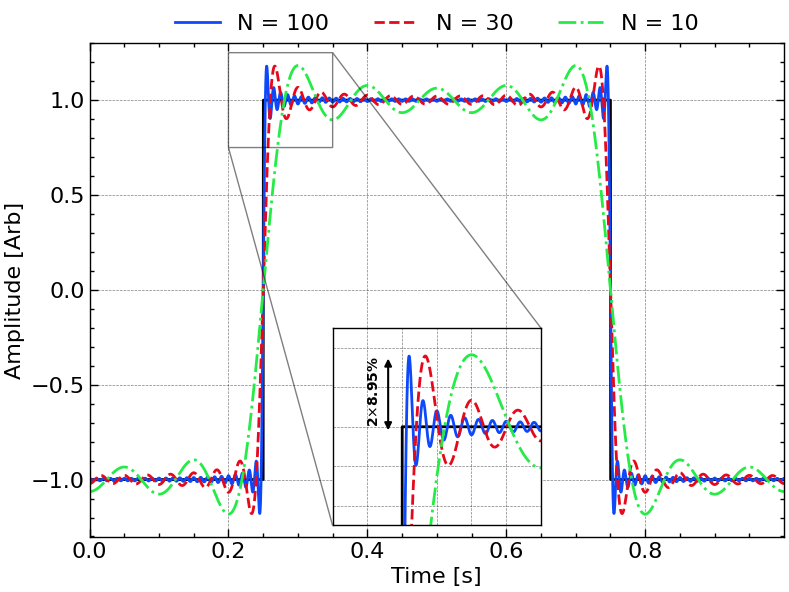

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()
plt.gcf()
plt.gca()

ax1 = plt.subplot(1, 1, 1)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
ax1ins = inset_axes(ax1, width="30%", height="40%", loc="lower center")

time = np.linspace(0, 1, 2 ** 13, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
omega = 2 * np.pi * 1.0
x = -np.sign(np.cos(omega * time) * 1.0)

fft_x = np.fft.rfft(signal)


ax1.plot(time, signal, 'k-')
ax1ins.plot(time, signal, 'k-', label = 'Signal')

for order in [10, 30, 100][::-1]:
    reconstructed_x = np.fft.irfft(fft_signal * (np.arange(fft_signal.size) < order))
    ax1.plot(time, reconstructed_signal, label = f"N = {order}")
    ax1ins.plot(time, reconstructed_signal, label = 'Reconstructed Signal (FFT)')

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.10), loc = 'upper center', ncol = 4)

ax1ins.set_ylim(0.75, 1.25)
ax1ins.set_xlim(0.20, 0.35)

ax1.indicate_inset_zoom(ax1ins, edgecolor="black")

plt.setp(ax1ins.get_xticklabels(), visible=False)
plt.setp(ax1ins.get_yticklabels(), visible=False)

ax1ins.grid('on')

ax1ins.tick_params(axis='both', which='both', length=0, labelsize=8)

ax1ins.annotate('', arrowprops=dict(arrowstyle="<|-|>, head_width = 0.3, head_length = 0.6", color='black', lw=1.5),
            xy=(0.24, 1.18), xytext=(0.24, 0.95),
            ha='center', va='bottom',
            color='black', weight='bold',
            bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
ax1ins.text(0.23, 1.00, r'2$\times$8.95%', ha='center', va='bottom', color='black', weight='bold', rotation = 90, fontsize = 10)

ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude [Arb]')
ax1.autoscale(axis = 'x', tight=True)

plt.tight_layout()
plt.savefig(save_path + 'figure_gibbs' + '.png',bbox_inches='tight',dpi=300)

plt.show()

/tmp/ipykernel_619265/4263314196.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.15), loc = 'upper center', ncol = 4)


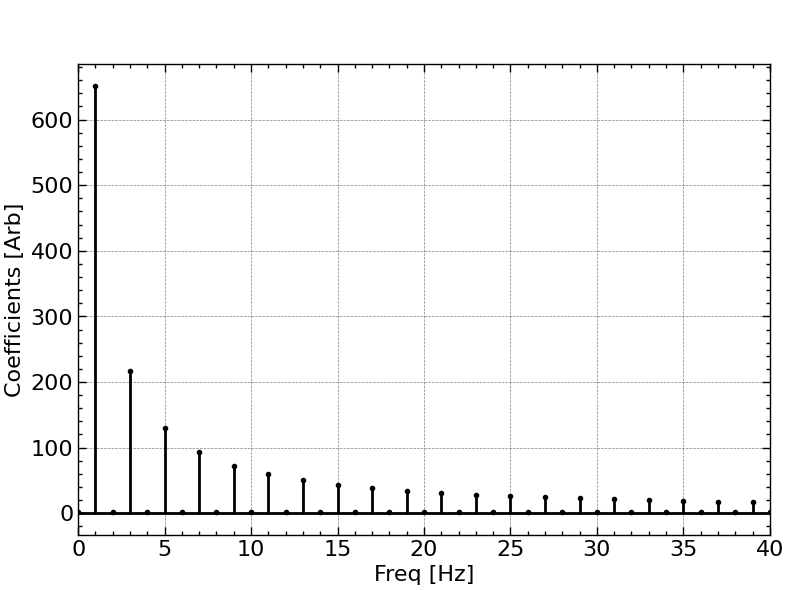

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()
plt.gcf()
plt.gca()

# plt.figure(figsize=(6, 4))
ax1 = plt.subplot(1, 1, 1)

N = 2 ** 10
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
omega = 2 * np.pi * 0.5
x = -np.sign(np.cos(omega * time))

freq = np.fft.rfftfreq(len(time), dt)
ax1.stem(freq, np.abs(np.fft.rfft(signal)), linefmt = 'k', markerfmt = 'k', basefmt = 'k')
# fft_x = np.fft.rfft(signal)

# ax1.plot(time, signal, 'k-')

# for order in [10, 30, 100]:
    # reconstructed_x = np.fft.irfft(fft_signal * (np.arange(fft_signal.size) < order))
    # ax1.plot(time, reconstructed_signal, label = f"N = {order}", linewidth = 1.5)

ax1.legend(frameon = False, bbox_to_anchor = (0.5, 1.15), loc = 'upper center', ncol = 4)

ax1.set_xlabel('Freq [Hz]')
ax1.set_ylabel('Coefficients [Arb]')
# ax1.set_yscale('log')
# ax1.set_xscale('log')

# ax1.autoscale(axis = 'x', tight=True)
ax1.set_xlim(0, 40)

plt.tight_layout()

plt.savefig(save_path + 'figure_ringing' + '.png',bbox_inches='tight',dpi=300)

plt.show()

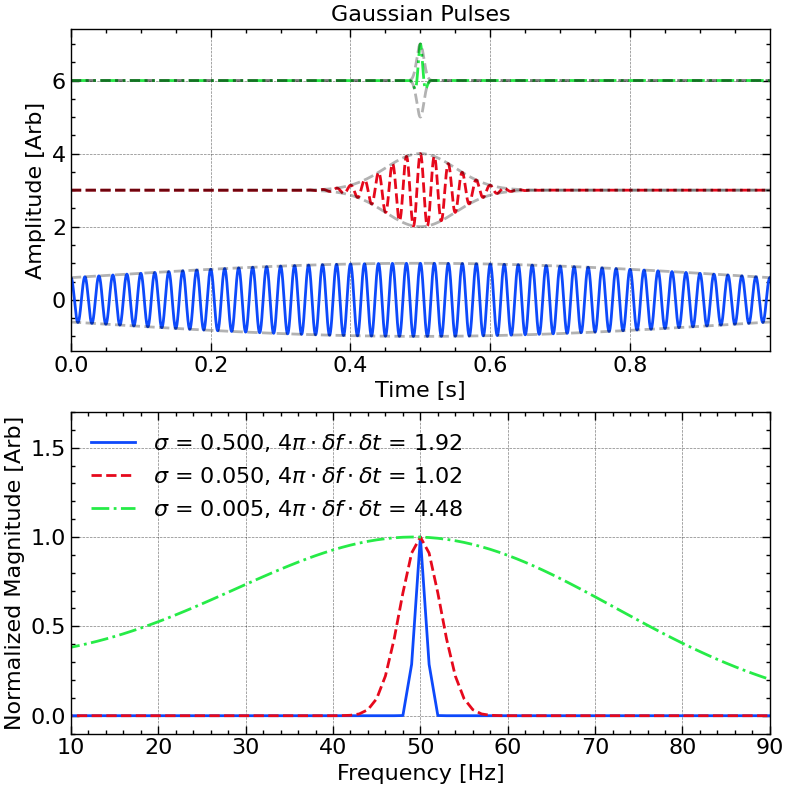

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
import scienceplots
plt.style.use(['science', 'nature', 'notebook', 'grid', 'high-vis'])

%matplotlib ipympl
plt.close()
plt.gcf()
plt.gca()

N = 2 ** 14
time = np.linspace(0, 1, N, endpoint=False)
dt = time[1] - time[0]
fs = 1 / dt
omega = 50.0 * 2 * np.pi
sigmas = np.array([0.5, 0.05, 0.005])

plt.figure(figsize=(8, 8))
ax1 = plt.subplot(2, 1, 1)
ax2 = plt.subplot(2, 1, 2)

for idx, sigma in enumerate(sigmas):
    x = np.exp(-((time - np.mean(time))**2) / (2 * sigma**2)) * np.cos(omega * time)  # 50 Hz 的正弦波调制的高斯脉冲
    ax1.plot(time, 3.0 * idx + signal)
    ax1.plot(time, 3.0 * idx + np.exp(-((time - np.mean(time))**2) / (2 * sigma**2)), 'k--', alpha = 0.3)
    ax1.plot(time, 3.0 * idx - np.exp(-((time - np.mean(time))**2) / (2 * sigma**2)), 'k--', alpha = 0.3)

    signal -= np.mean(signal)  # 去除直流分量
    # ----- 频域谱 -----
    freq, psd = scipy.signal.welch(signal, fs, nperseg = N)  # 使用Welch方法计算功率谱密度

    t0 = np.sum(time * np.abs(signal)**2) / np.sum(signal ** 2)        # 中心时刻
    delta_t = np.sqrt(np.sum(((time - t0)**2) * signal**2) / np.sum(signal**2))
    
    f0 = np.sum(freq * psd) / np.sum(psd)
    delta_f = np.sqrt(np.sum(((freq - f0)**2) * psd) / np.sum(psd))

    ax2.plot(freq, psd / np.max(psd), label = r"$\sigma$ = %.3f, $4\pi \cdot \delta f \cdot \delta t$ = %.2f" % (sigma, 4 * np.pi * delta_t * delta_f))

# ---------------- 轴标签与图例 ----------------
# ax1.set_title("Gaussian Pulses (Time Domain)")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Amplitude [Arb]")

# ax2.set_title("Magnitude Spectra (Frequency Domain)")
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Normalized Magnitude [Arb]")
ax2.legend(frameon = False, ncols = 1, loc = 'upper left')

ax1.autoscale(axis = 'x', tight=True)
ax2.set_xlim(10, 90)
ax2.set_ylim(-0.1, 1.7)
ax1.set_title('Gaussian Pulses')

plt.tight_layout()

plt.savefig(save_path + 'figure_uncertainty_principle' + '.png',bbox_inches='tight',dpi=300)
plt.show()

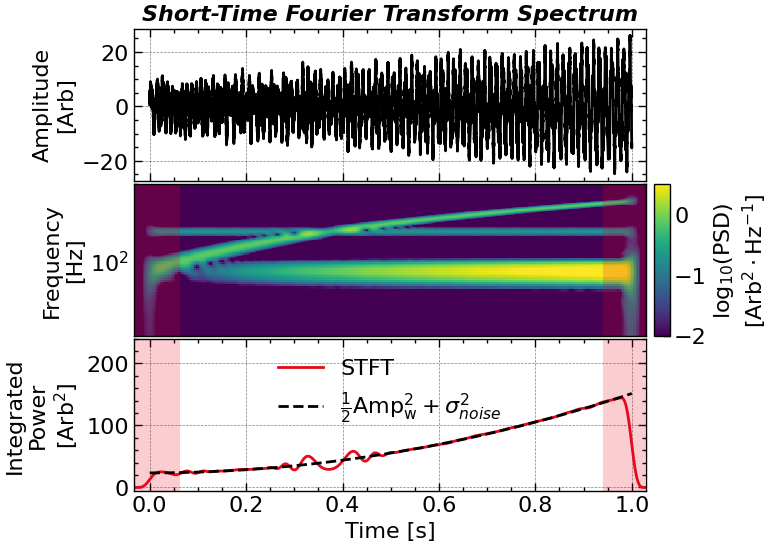

In [277]:

# widths = bandwidth * scales / (2 * np.pi)
# coef = scipy.signal.cwt(
#     signal,
#     scipy.signal.morlet2,
#     widths = widths,
#     w = bandwidth,
#     dtype = np.complex128
# )
# frequency = 1 / dt / scales

# === Option 2: pywt implementation ===
# Unlike scipy.signal.cwt, pywt.cwt is not L2-normalized.
# You need to multiply the coefficients by a factor to make them L2-normalized.
# Another two problems with pywt.cwt: The precision of the wavelet may be unenough while you can still not adjust the precision yourself.
# Check https://github.com/PyWavelets/pywt/issues/531
# This defect has been proposed at 2019 but still not fixed yet.

# central_frequency = 1.0
# wavelet = 'cmor%.1f-%.1f' % (bandwidth, central_frequency)
# coef, frequency = pywt.cwt(signal, scales, wavelet, dt, method = 'fft')
# coef *= np.sqrt(np.sqrt(bandwidth) * np.sqrt(2 * np.pi))  # amplitude normalization for Morlet

# === Option 3: ssqueezepy implementation (default used here) ===
# This one is accurate and fast. They claim that this package is the fastest implementation of the wavelet transform in Python.
# bandwidthut, this implementation is not elegantly designed and the input parameters are not well documented.
# Also, it requires package numba, which may raise some compatibility issues.
# coef, scales = ssqueezepy.cwt(signal, ('morlet', {'mu': bandwidth}), scales = bandwidth / (2 * np.pi) * scales.astype(np.float32), fs = 1 / dt, l1_norm = False)
# frequency = bandwidth / (2 * np.pi) / dt / scales

plt.close()
plt.figure(figsize=(8, 6))
plt.subplots_adjust(hspace = 0.02, right = 0.82, left = 0.18)

ax1 = plt.subplot(3, 1, 1)
ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax3 = plt.subplot(3, 1, 3, sharex=ax1)

N = 2 ** 15
t = np.linspace(0, 1, N)
dt = t[1] - t[0]
fs = 1 / dt

omega = 250

# Generate a signal with 4 components: 
# 1. Sinuoidal; 2. Growing Sinuoidal; 3. Chirping Sinuoidal; 4. White noise

x = 3 * np.sin(5 * omega * t) + 16 * t  * np.sin(2 * omega * t) + 6 * np.sin(2 * omega * (2 * t + 1) * t)
noise_level = 1.0
x += np.random.randn(N) * noise_level

ax1.plot(t, x, 'k-', label = 'Signal')
ax1.autoscale(axis='x', tight=True)

step = 100
window = 2048
window_in_seconds = window * dt  # window length in seconds
mfft = window * 5

hann_window = scipy.signal.windows.hann(window, sym = True)  # symmetric Gaussian window
STFT = scipy.signal.ShortTimeFFT(hann_window, hop=step, fs = fs, scale_to='psd', fft_mode = 'onesided2X', mfft = mfft)  # create the STFT object
stft_psd = STFT.stft(x)  # perform the STFT
stft_time = np.arange(0, stft_psd.shape[1]) * STFT.hop / fs - STFT.win.size / 2 / fs  # time vector for STFT
stft_frequency = np.fft.rfftfreq(mfft, d=dt)  # frequency vector for STFT
stft_psd = np.abs(stft_psd) ** 2
# stft_psd[0, :] *= 0.0

pc2 = ax2.pcolormesh(stft_time, stft_frequency, np.log10(stft_psd), cmap='viridis', vmax=.5, vmin=-2.0)

for ax in [ax2, ax3]:
    ax.axvspan(stft_time[0], STFT.lower_border_end[0] * STFT.T, color='C1', linewidth=0, alpha=.2)
    ax.axvspan(STFT.upper_border_begin(x.size)[0] * STFT.T, stft_time[-1], color='C1', linewidth=0, alpha=.2)


ax2.set_yscale('log')

df = np.diff(stft_frequency)[0]
integrated_stft_psd = np.nansum((stft_psd.T * df), axis=1)
ax3.plot(stft_time, integrated_stft_psd, 'C1', label='STFT')

# Theoretical PSD defined as half of the sum of the square of amplitudes of the components
ax3.plot(t, np.ones_like(t) * (3 ** 2 + (16 * t) ** 2 + 6 ** 2 + 2 * noise_level ** 2) / 2, 'k--', label=r'$\frac{1}{2}{\mathrm{Amp_{w}^2} + \sigma_{noise}^2}$')

ax3.legend(frameon=False, ncols = 1, loc = 'upper center')

ax2.autoscale(axis='y', tight=True)
ax1.autoscale(axis='x', tight=True)
# ax1.set_xlim(0, 1)

ax2.set_ylim(18, 600)
ax3.set_ylim(-5, 240)
ax3.set_xlabel('Time [s]')
ax1.set_ylabel('Amplitude\n[Arb]')
ax2.set_ylabel('Frequency\n[Hz]')
ax3.set_ylabel('Integrated\nPower\n[$\mathrm{Arb}^2$]')

plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax2.get_xticklabels(), visible=False)

fig = plt.gcf()
cbar_ax2 = fig.add_axes(
    [ax2.get_position().x1 + 0.01, ax2.get_position().y0, 0.02, ax2.get_position().y1 - ax2.get_position().y0])
cbar2 = plt.colorbar(pc2, cax=cbar_ax2)
cbar2.ax.xaxis.set_label_position('top')
cbar2.ax.xaxis.set_ticks_position('top')
cbar2.ax.tick_params(which='major', length=4, direction='in', pad=3)
cbar2.ax.set_ylabel('$\mathrm{log_{10}(PSD)}$\n$\mathrm{[Arb^2 \cdot Hz^{-1}]}$')

ax1.set_title('Short-Time Fourier Transform Spectrum', **title_font)

# plt.savefig(save_path + 'figure_stft' + '.png',bbox_inches='tight',dpi=300)

plt.show()

In [243]:
STFT.lower_border_end[0] * STFT.T

np.float64(0.24710837122714926)

9.210711661013256


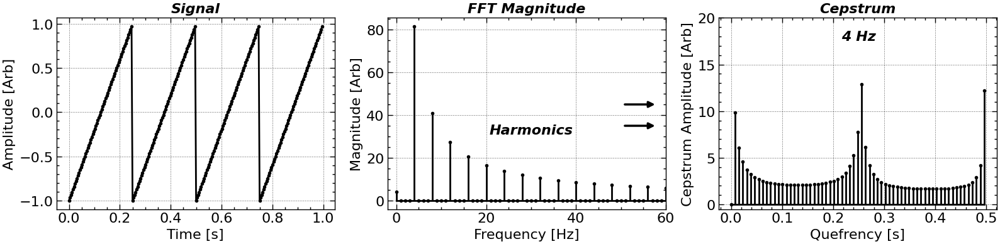

In [ ]:
plt.close()
plt.figure(figsize=(16, 4))

N = 2 ** 8
omega0 = 2 * np.pi * 4.0
t = np.linspace(0, 1, N, endpoint=False)
dt = t[1] - t[0]
fs = 1 / dt

x = 2 * ((omega0 / 2 / np.pi * t) % 1.0 - 0.5)
x += np.random.randn(t.size) * 0e-1 # Add some noise
f = np.fft.rfftfreq(N, dt)
X = np.fft.rfft(x)

CEPSTRUM_MAGNITUDE_THRESHOLD = np.sqrt(np.mean(np.abs(X) ** 2))
print(CEPSTRUM_MAGNITUDE_THRESHOLD)

log_abs_X = np.log(np.abs(CEPSTRUM_MAGNITUDE_THRESHOLD + X))
log_abs_X -= np.mean(log_abs_X)  # Remove DC component for cepstrum calculation
cepstrum = np.fft.rfft(log_abs_X)
df = f[1] - f[0]
quefrency = np.fft.rfftfreq(log_abs_X.size, df)


ax1 = plt.subplot(1, 3, 1)
ax2 = plt.subplot(1, 3, 2)
ax3 = plt.subplot(1, 3, 3)

ax1.plot(t, x, 'ko-', label='Signal')
ax2.stem(f, np.abs(X), linefmt='k', markerfmt='k', basefmt='k')

ax3.stem(quefrency, np.abs(cepstrum), linefmt='k', markerfmt='k', basefmt='k')
# ax3.vlines(1 / (omega0 / (2 * np.pi)), 0, 41, color='C1', linestyle='-', label='Fundamental Frequency')

ax2.annotate('', arrowprops=dict(arrowstyle="-|>, head_width = 0.4, head_length = 0.8", color='k', lw=2.5),
            xy=(58, 35), xytext=(50, 35),
            ha='center', va='bottom',
            color='k', weight='bold',
            bbox=dict(boxstyle="round,pad=0.3", edgecolor='k', facecolor='w'))
ax2.annotate('', arrowprops=dict(arrowstyle="-|>, head_width = 0.4, head_length = 0.8", color='k', lw=2.5),
            xy=(58, 45), xytext=(50, 45),
            ha='center', va='bottom',
            color='k', weight='bold',
            bbox=dict(boxstyle="round,pad=0.3", edgecolor='k', facecolor='w'))

ax2.text(30, 30, 'Harmonics', color = 'k', ha = 'center', va = 'bottom', **title_font)
ax3.text(1 / (omega0 / (2 * np.pi)), 18, '4 Hz', color = 'k', ha = 'center', va = 'center', **title_font)
ax3.set_ylim(-0.5, 20)

ax1.set_title('Signal', **title_font)
ax2.set_title('FFT Magnitude', **title_font)
ax3.set_title('Cepstrum', **title_font)

ax1.set_xlabel('Time [s]')
ax2.set_xlabel('Frequency [Hz]')
ax3.set_xlabel('Quefrency [s]')
ax1.set_ylabel('Amplitude [Arb]')
ax2.set_ylabel('Magnitude [Arb]')
ax3.set_ylabel('Cepstrum Amplitude [Arb]')

ax2.set_xlim(-2, 60)

plt.tight_layout()

plt.savefig(save_path + 'figure_cepstrum' + '.png',bbox_inches='tight',dpi=300)

plt.show()